In [1]:
import numpy as np, matplotlib.pyplot as plt, matplotlib as mpl
import pcmdpy as ppy
import pandas as pd
import easydarkfigs
%matplotlib inline

In [2]:
%set_darkfigdir figures_dark/
%set_lightfigdir figures/

# Load Data

In [3]:
%%time
from setup_files.results import models, results, pcmds, data

M87
M49
NGC3377
NGC4993
DF2
CPU times: user 1min 33s, sys: 2.51 s, total: 1min 35s
Wall time: 1min 37s


In [4]:
%%time
from setup_files.drivers import filters, iso_models, drivers

Loading Isochrone Models


GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.

CPU times: user 58.1 s, sys: 12 s, total: 1min 10s
Wall time: 1min 13s


GPU acceleration not available. Continuing without.

In [5]:
dmods = {
    'NGC3377': 30.18,
    'NGC4993': 33.05,
    'M87': 31.02,
    'M49': 31.0,
    'DF2': 31.505,
}

In [6]:
regions = {
    'M87_m3': 44,
    'M87_m4': 104,
    'M87_m4_q1': 101,
    'M87_m4_q2': 102,
    'M87_m4_q3': 103,
    'M87_m5': 204,
    'M87_m6': 264,
    'M87_m7': 104,
    'M87_m8': 104,
    'M87_m9': 104,
    'M87_m10': 104,
    'M87_m11': 104,
    'M87_m12': 104,
    'M87_m13': 104,
    'M87_m14': 104,
    'M87_m15': 104,
    'M87_m16': 104,
    'M87_m17': 104,
    'M87_m18_1': 44,
    'M87_m18_2': 104,
    'M87_m18_3': 204,
    'M87_m18_4': 264,    

    'M49_m3': 40,
    'M49_m4': 100,
    'M49_m4_q1': 97,
    'M49_m4_q2': 98,
    'M49_m4_q3': 99,
    'M49_m5': 204,
    'M49_m6': 256,
    'M49_m7': 100,
    'M49_m8': 100,
    'M49_m9': 100,
    'M49_m10': 100,
    'M49_m11_1': 40,
    'M49_m11_2': 100,
    'M49_m11_3': 204,
    'M49_m11_4': 256,
    
    'NGC3377_m3': 41,
    'NGC3377_m4': 97,
    'NGC3377_m4_q1': 97,
    'NGC3377_m4_q2': 98,
    'NGC3377_m4_q3': 99,
    'NGC3377_m5': 173,
    'NGC3377_m6': 241,
    'NGC3377_m7': 97,
    'NGC3377_m8': 97,
    'NGC3377_m9': 97,
    'NGC3377_m10': 97,
    'NGC3377_m11_1': 41,
    'NGC3377_m11_2': 97,
    'NGC3377_m11_3': 173,
    'NGC3377_m11_4': 241,
    
}

In [7]:
df_radii = pd.read_csv('results/regions_radii.csv')

In [8]:
radii_am = {}
radii_kpc = {}
for k, r in regions.items():
    g = k.split('_')[0]
    radii_am[k] = df_radii[g][r] * 0.05 / 60.
    radii_kpc[k] = radii_am[k] * (np.pi / 180.) / 60. * ppy.distancemodels.dmod_to_mpc(dmods[g]) * 1e3

In [26]:
radii_am

{'M49_m10': 1.3223858602192768,
 'M49_m11_1': 1.747429724579636,
 'M49_m11_2': 1.3223858602192768,
 'M49_m11_3': 0.5863370987535748,
 'M49_m11_4': 0.3110074940462389,
 'M49_m3': 1.747429724579636,
 'M49_m4': 1.3223858602192768,
 'M49_m4_q1': 1.328000505670286,
 'M49_m4_q2': 1.3001812098860126,
 'M49_m4_q3': 1.3221248023164318,
 'M49_m5': 0.5863370987535748,
 'M49_m6': 0.3110074940462389,
 'M49_m7': 1.3223858602192768,
 'M49_m8': 1.3223858602192768,
 'M49_m9': 1.3223858602192768,
 'M87_m10': 1.5726208468076235,
 'M87_m11': 1.5726208468076235,
 'M87_m12': 1.5726208468076235,
 'M87_m13': 1.5726208468076235,
 'M87_m14': 1.5726208468076235,
 'M87_m15': 1.5726208468076235,
 'M87_m16': 1.5726208468076235,
 'M87_m17': 1.5726208468076235,
 'M87_m18_1': 1.925144312602137,
 'M87_m18_2': 1.5726208468076235,
 'M87_m18_3': 0.7803857492763512,
 'M87_m18_4': 0.4237015575724741,
 'M87_m3': 1.925144312602137,
 'M87_m4': 1.5726208468076235,
 'M87_m4_q1': 1.579195266382598,
 'M87_m4_q2': 1.578062933907689

In [9]:
radii_kpc

{'M49_m10': 6.096552443825942,
 'M49_m11_1': 8.056118322403682,
 'M49_m11_2': 6.096552443825942,
 'M49_m11_3': 2.703170821653505,
 'M49_m11_4': 1.4338277161866921,
 'M49_m3': 8.056118322403682,
 'M49_m4': 6.096552443825942,
 'M49_m4_q1': 6.122437460805699,
 'M49_m4_q2': 5.994183067892721,
 'M49_m4_q3': 6.0953488970825545,
 'M49_m5': 2.703170821653505,
 'M49_m6': 1.4338277161866921,
 'M49_m7': 6.096552443825942,
 'M49_m8': 6.096552443825942,
 'M49_m9': 6.096552443825942,
 'M87_m10': 7.317287948185813,
 'M87_m11': 7.317287948185813,
 'M87_m12': 7.317287948185813,
 'M87_m13': 7.317287948185813,
 'M87_m14': 7.317287948185813,
 'M87_m15': 7.317287948185813,
 'M87_m16': 7.317287948185813,
 'M87_m17': 7.317287948185813,
 'M87_m18_1': 8.957553440626176,
 'M87_m18_2': 7.317287948185813,
 'M87_m18_3': 3.6310769056047834,
 'M87_m18_4': 1.9714518646667045,
 'M87_m3': 8.957553440626176,
 'M87_m4': 7.317287948185813,
 'M87_m4_q1': 7.347878233962536,
 'M87_m4_q2': 7.34260957509361,
 'M87_m4_q3': 7.47

In [10]:
for k, r in results.items():
    print(k, r.as_dynesty()['delta_logz'][-1])

M87_m3 0.24459074402233227
M87_m4 0.3439615295963563
M87_m4_q1 0.22577387534163051
M87_m4_q2 0.9915027045825155
M87_m4_q3 0.41042617798818526
M87_m5 0.9232132979450682
M87_m6 0.001503391747590399
M87_m7 0.1972094524945902
M87_m8 0.005791599905890621
M87_m9 0.0038194001974147795
M87_m10 0.08815728242113607
M87_m11 0.02762584739881646
M87_m12 3.1226191481437127e-06
M87_m13 0.24346644994887612
M87_m14 0.1984865280778365
M87_m15 0.0015838422544121045
M87_m16 0.029236442410237373
M87_m17 0.1393737970171003
M87_m18_1 0.04278993762810046
M87_m18_2 0.2551525367992724
M87_m18_3 0.6967865844482901
M87_m18_4 0.00010948337330773938
M49_m3 1.0987497785497737
M49_m4 1.0955459574655606
M49_m4_q1 8.02476466042998
M49_m4_q2 4.116785939290764
M49_m4_q3 1.0845404881079332
M49_m5 1.0967491937654756
M49_m6 5.358162241414561
M49_m7 0.6984607233598865
M49_m8 8.662343282139773e-05
M49_m9 1.0026640752892604
M49_m10 0.27984887331734853
M49_m11_1 0.7204922707025219
M49_m11_2 0.5546765909529938
M49_m11_3 1.015566

# IMF

In [11]:
model_kroupa = models['M87_m9'].copy()
model_kroupa.set_params(np.array([0.0, -1.8, 5.0, 9.8, 30.0]))
results['kroupa_m1'] = ppy.results.ResultsPlotter(
    'results/kroupa_m1.csv', live_file='results/kroupa_m1_live.csv', 
    gal_model=model_kroupa, model_is_truth=True
)
results['kroupa_m2'] = ppy.results.ResultsPlotter(
    'results/kroupa_m2.csv', live_file='results/kroupa_m2_live.csv', 
    gal_model=model_kroupa, model_is_truth=True
)
results['kroupa_m3'] = ppy.results.ResultsPlotter(
    'results/kroupa_m3.csv', live_file='results/kroupa_m3_live.csv', 
    gal_model=model_kroupa, model_is_truth=True
)

[Text(0, 0, 'Too Bottom-Heavy'), Text(0, 0, 'Too Bottom-Light')]

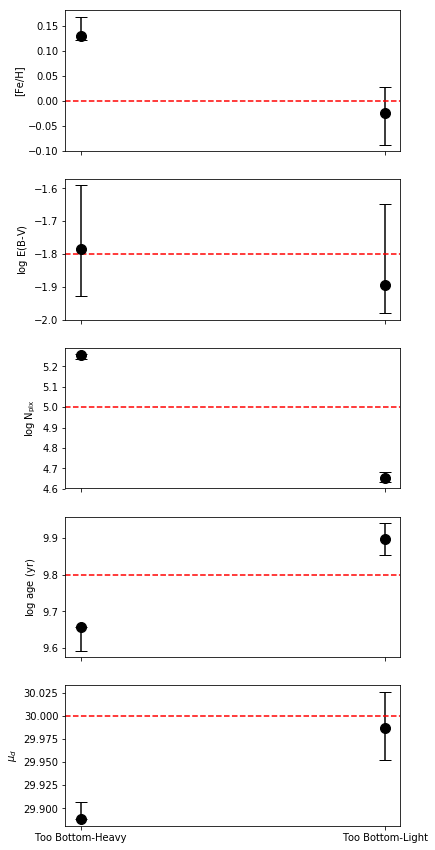

In [12]:
fig, axes = plt.subplots(nrows=5, figsize=(6, 15), sharex=True)
for i, m in enumerate(['m2','m3']):
    results[f'kroupa_{m}'].plot_errorbars(axes, x=i, color='k')
for i, a in enumerate(axes):
    a.set_ylabel(results['kroupa_m2'].labels[i])
    a.axhline(y=results['kroupa_m2'].true_params[i], color='r', ls='--')
axes[-1].set_xticks([0,1])
axes[-1].set_xticklabels(['Too Bottom-Heavy', 'Too Bottom-Light'])

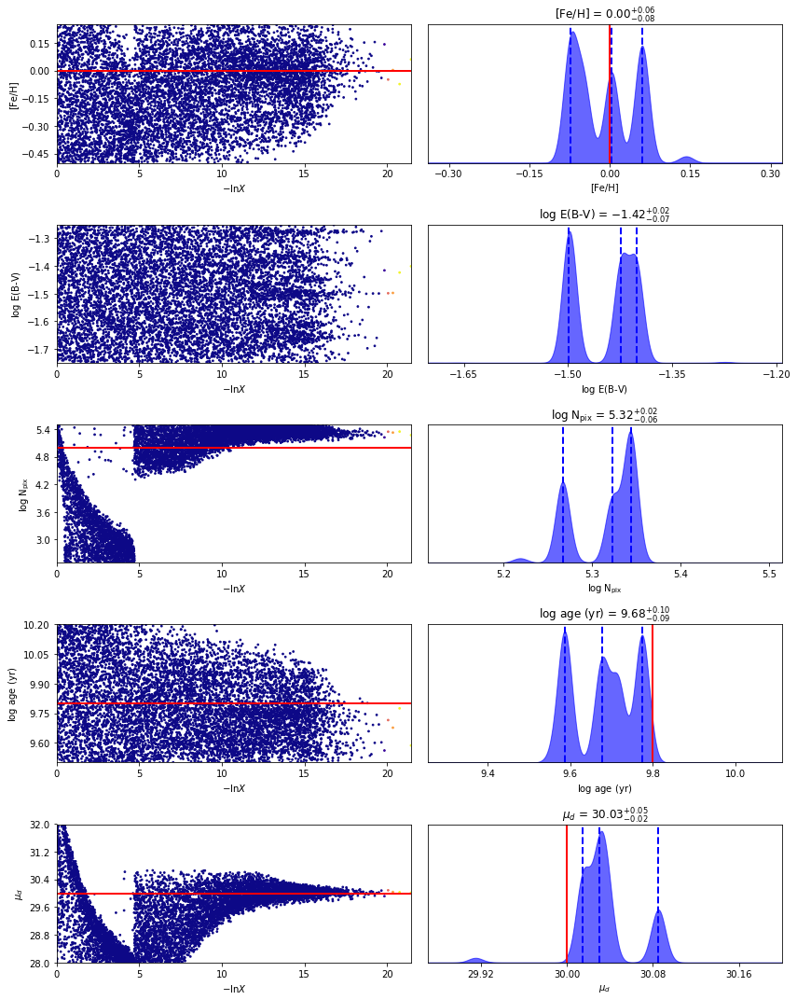

In [13]:
results['kroupa_m1'].plot_trace();
plt.tight_layout()

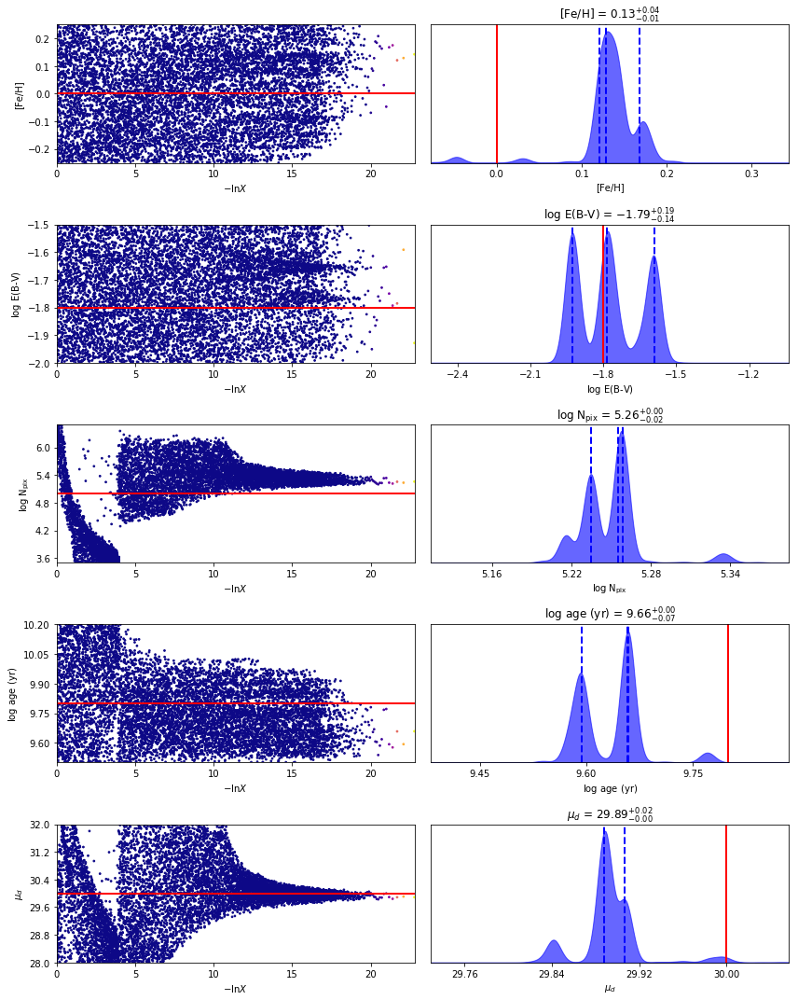

In [14]:
results['kroupa_m2'].plot_trace();
plt.tight_layout()

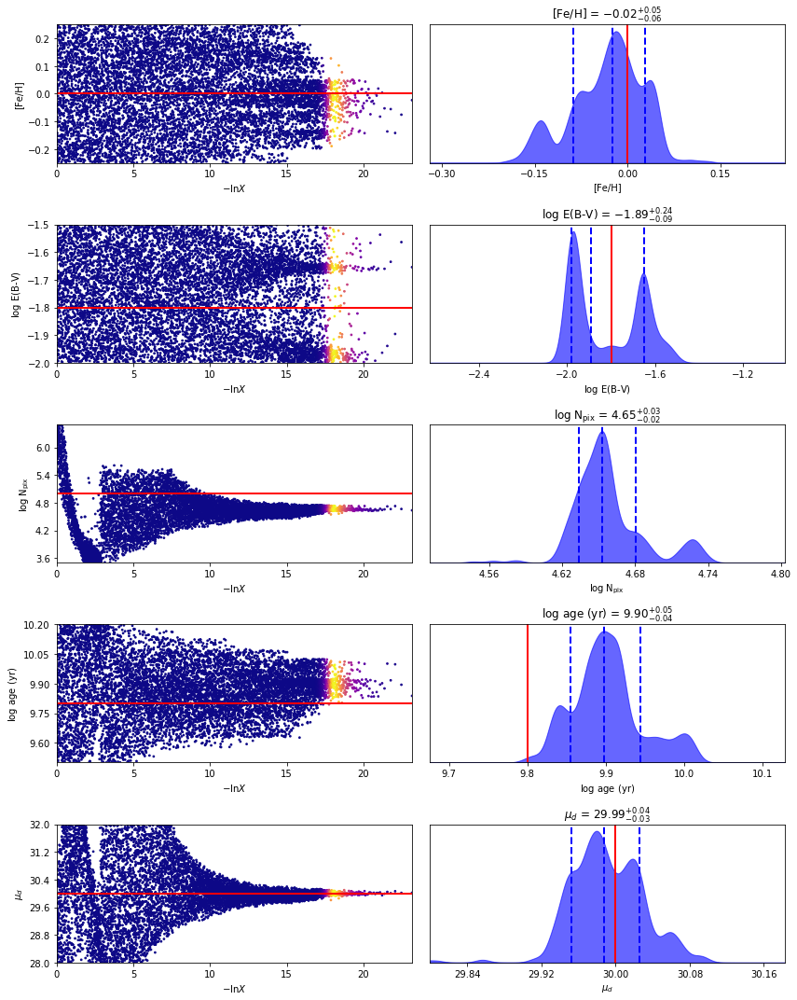

In [15]:
results['kroupa_m3'].plot_trace();
plt.tight_layout()

# PSF

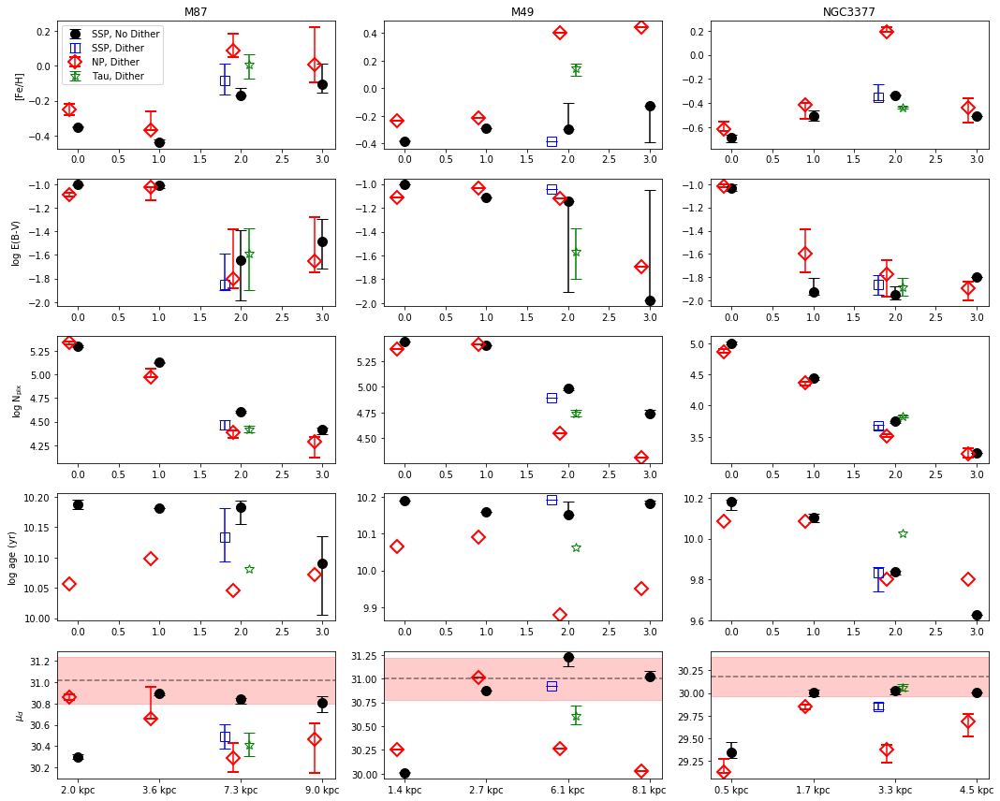

In [25]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15,12), sharex=False, sharey=False)
for i, g in enumerate(['M87', 'M49', 'NGC3377']):
    m = ('18' if g=='M87' else '11')
    xticks = []
    for j, k in enumerate([f'{g}_m{m}_4', f'{g}_m{m}_3', f'{g}_m{m}_2', f'{g}_m{m}_1']):
        results[k].plot_errorbars(axes[:,i], x=j, color='k', label=('SSP, No Dither' if j==0 else None))
        xticks.append(f'{radii_kpc[k]:.1f} kpc')
    # SSP
    results[f'{g}_m9'].plot_errorbars(axes[:,i], x=2-0.2, color='b', marker='s', mfc='None', label='SSP, Dither')
    # Non-Param
    for j, d in enumerate([6,5,4,3]):
        k = f'{g}_m{d}'
        results[k].plot_errorbars([axes[0,i], axes[1,i], None, None, None, None, None, axes[4,i], axes[2,i]], x=j-0.1,
                                  marker='D', mfc='None', color='r', mec='r', mew=2, label=('NP, Dither' if j==0 else None))
        axes[3,i].plot(j-0.1, results[k].best_model.sfh_model.mean_age(), marker='D', mfc='None', mec='r', mew=2, ms=10)
    # Tau
    results[f'{g}_m8'].plot_errorbars([axes[0,i], axes[1,i], axes[2,i], None, axes[4,i]], x=2.1, color='g', marker='*', mfc='None', label='Tau, Dither')
    axes[3,i].plot(2.1, results[f'{g}_m8'].best_model.sfh_model.mean_age(), marker='*', color='g', mfc='None', ms=10)
    axes[0,i].set_title(g)
    axes[-1,i].axhspan(dmods[g]-0.22, dmods[g]+0.22, color='r', alpha=0.2)
    axes[-1,i].axhline(y=dmods[g], color='k', ls='--', alpha=0.5)
    axes[-1,i].set_xticks([0,1,2,3])
    axes[-1,i].set_xticklabels(xticks)
for i, ax in enumerate(axes[:,0]):
    ax.set_ylabel(results['M87_m9'].labels[i])
axes[0,0].legend(loc=2)
plt.tight_layout()
plt.savefig('figures/Dither_errorbars.pdf')

In [30]:
sfh = results['M87_m9'].best_model.sfh_model

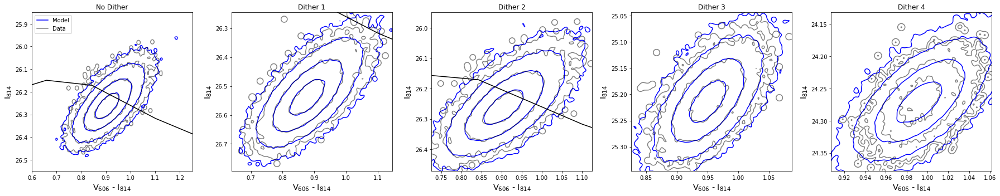

In [18]:
gal = 'M87'
fig, axes = plt.subplots(ncols=5, figsize=(25, 5), sharex=False, sharey=False)
for i, m in enumerate(['9', '18_1', '18_2', '18_3', '18_4']):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m{m}'], ax=axes[i], color='k', alpha=0.5, label='Data')
for a in axes:
    ppy.plotting.plot_isochrone(iso_models[gal], axes=a, dmod=dmods[gal])
for i, k in enumerate(['No Dither', 'Dither 1', 'Dither 2', 'Dither 3', 'Dither 4']):
    axes[i].set_title(k)
axes[0].set_xlim([0.6, 1.25])
axes[0].set_ylim([26.55, 25.85])
axes[0].legend(loc=2)
plt.tight_layout()

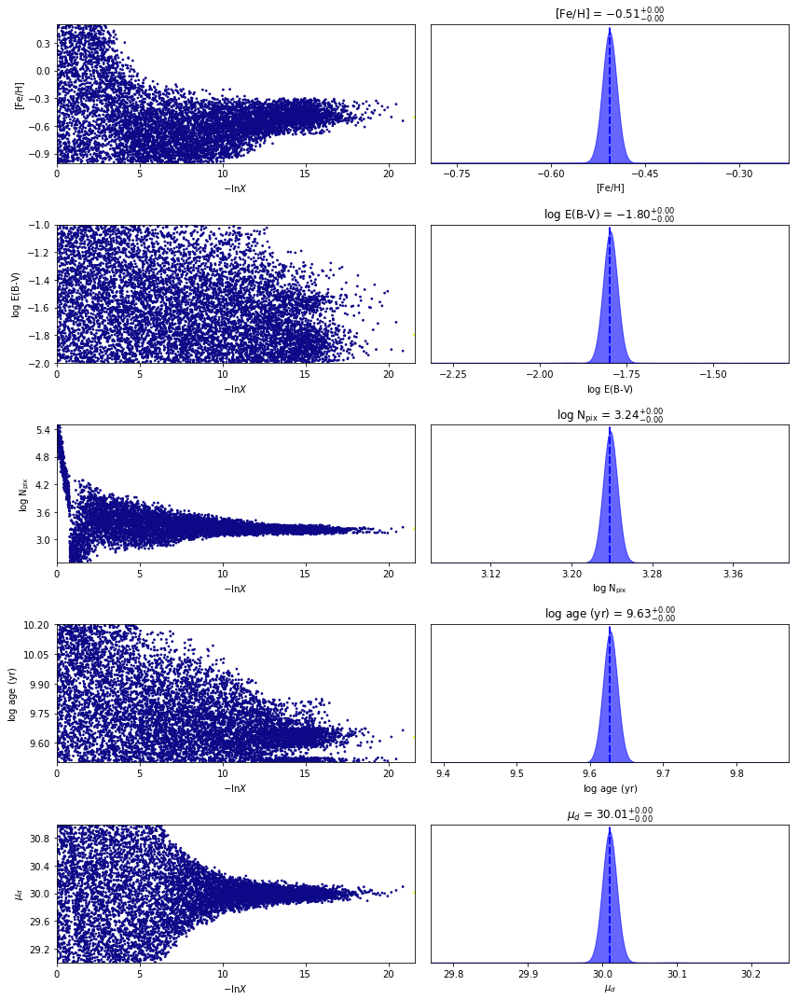

In [34]:
results['NGC3377_m11_1'].plot_trace();
plt.tight_layout()

# Simpler Models

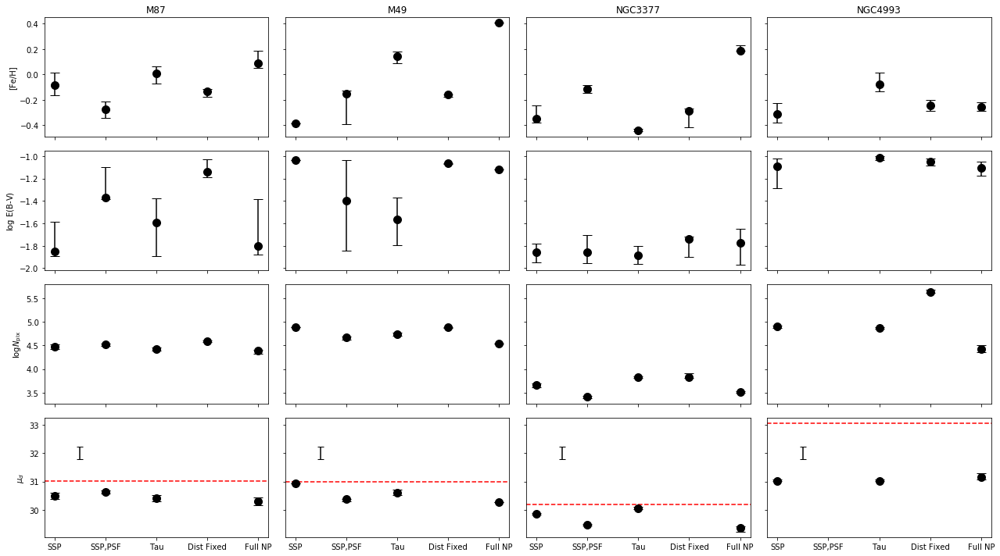

In [12]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18, 10), sharex=True, sharey='row')
for i, g in enumerate(['M87', 'M49','NGC3377', 'NGC4993']):
    k = f'{g}_m9'
    results[k].plot_errorbars([axes[0,i], axes[1,i], axes[2,i], None, axes[3,i]], x=0, color='k')
    if g != 'NGC4993':
        k = (f'{g}_m10' if g != 'M87' else 'M87_m17')
        results[k].plot_errorbars([axes[0,i], axes[1,i], axes[2,i], None, axes[3,i]], x=1, color='k')
    k = f'{g}_m8'
    results[k].plot_errorbars([axes[0,i], axes[1,i], axes[2,i], None, axes[3,i]], x=2, color='k')
    k = f'{g}_m7'
    results[k].plot_errorbars([axes[0,i], axes[1,i], None, None, None, None, None, axes[2,i]], x=3, color='k')
    k = f'{g}_m4'
    results[k].plot_errorbars([axes[0,i], axes[1,i], None, None, None, None, None, axes[3,i], axes[2,i]], x=4, color='k')
    axes[0, i].set_title(g)
    axes[-1, i].axhline(y=dmods[g], ls='--', color='r')
labels = results['NGC3377_m3'].labels
labels = [labels[0], labels[1], labels[-1], labels[-2]]
for ax in axes[-1]:
    ax.errorbar(x=0.5, y=32.0, yerr=0.22, marker='', color='k', capsize=4)
for i, ax in enumerate(axes[:,0]):
    ax.set_ylabel(labels[i])
    ax.set_xticks([0,1,2,3,4])
    ax.set_xticklabels(['SSP', 'SSP,PSF', 'Tau', 'Dist Fixed', 'Full NP'])
plt.tight_layout()

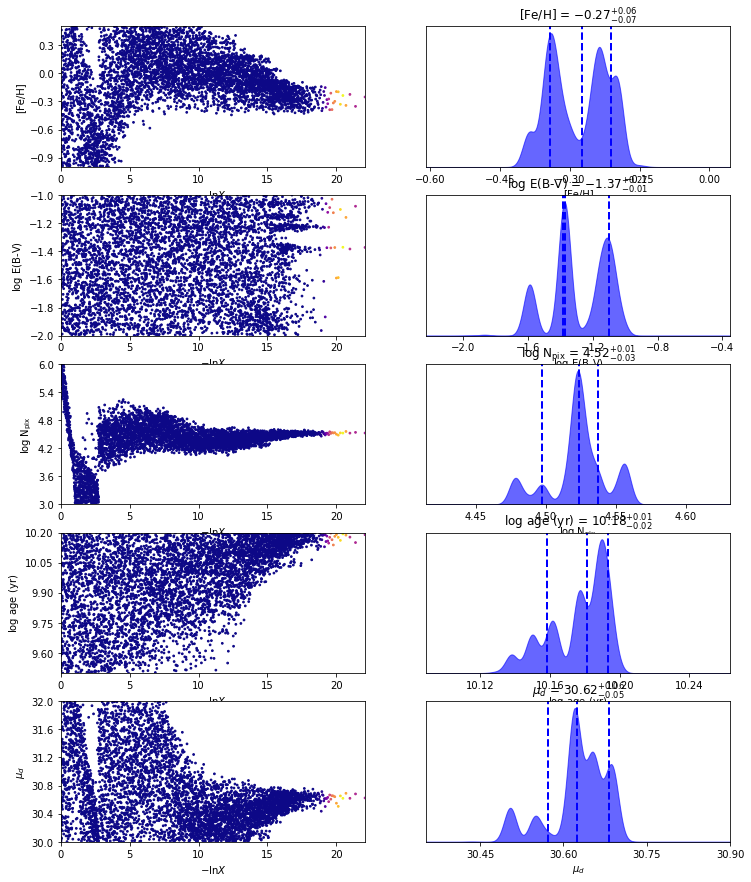

In [56]:
results['M87_m17'].plot_trace();

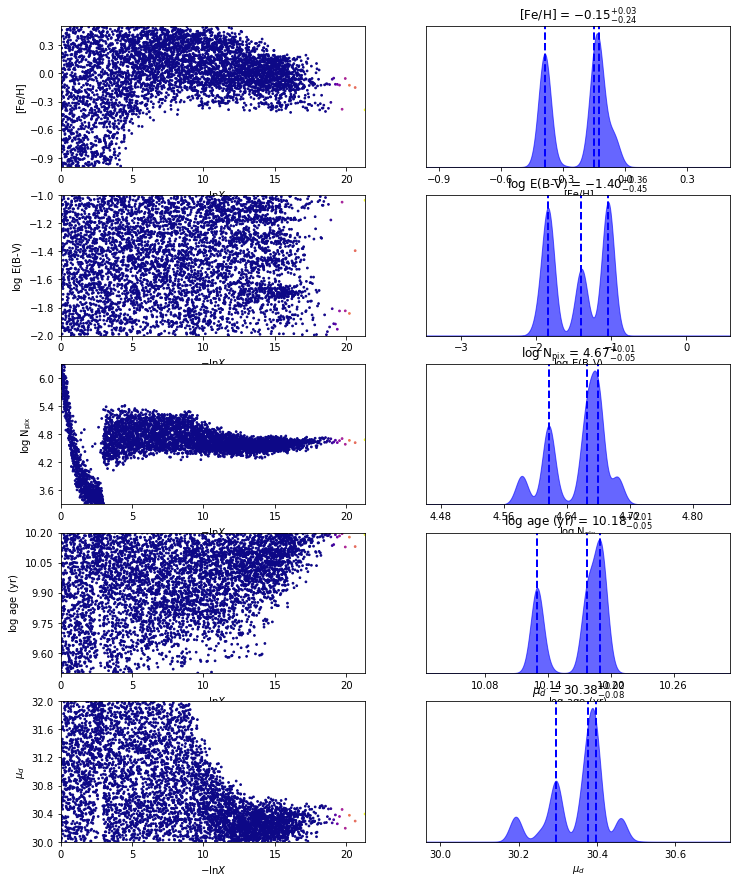

In [57]:
results['M49_m10'].plot_trace();

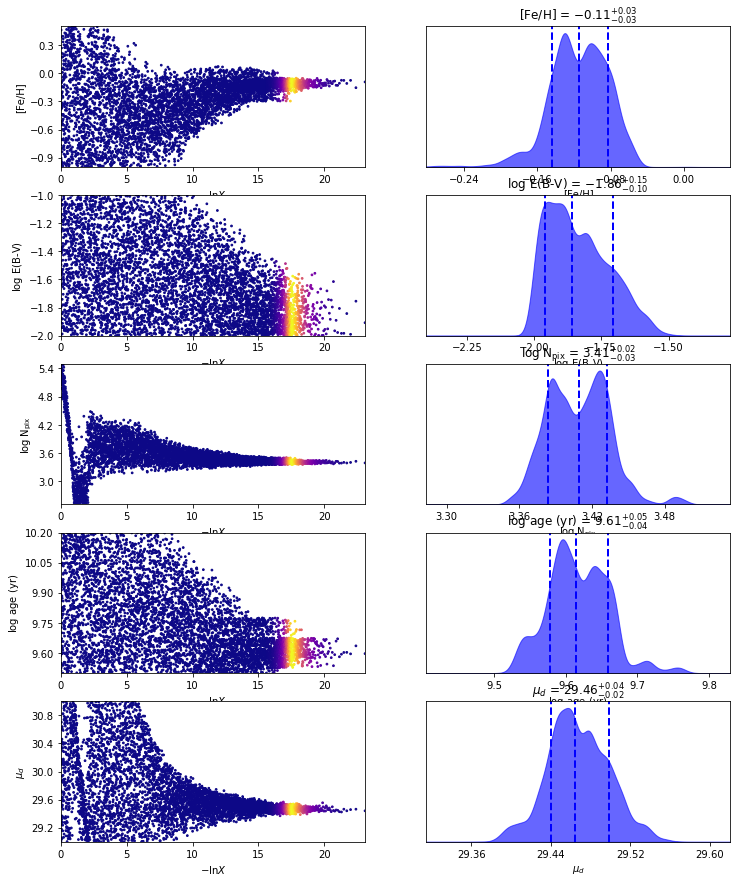

In [58]:
results['NGC3377_m10'].plot_trace();

In [66]:
g = results['M87_m9'].best_model

In [68]:
g.dmod

30.61

In [69]:
[a for a in g.iter_SSPs()]

[(10.134, -0.17565, 32136.60538640315, 30.61)]

In [72]:
i = iso_models['M87']

In [74]:
i._interp_cols

['initial_mass', 'star_mass', 'ACS_WFC_F814W', 'ACS_WFC_F606W']

In [60]:
d = drivers['M87']

In [61]:
pcmd1, _ = d.simulate(results['M87_m9'].best_model, 256, dither=True)
pcmd2, _ = d.simulate(results['M87_m9'].best_model, 256, dither=False)

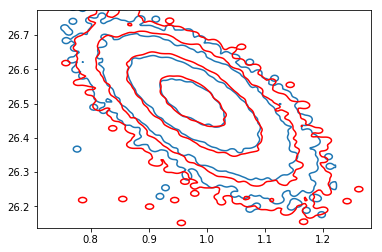

In [64]:
fig, [ax] = ppy.plotting.plot_pcmd_contours(pcmd1)
fig, [ax] = ppy.plotting.plot_pcmd_contours(pcmd2, ax=ax, color='r')

[Text(0, 0, 'SSP'),
 Text(0, 0, 'Lower Exposure'),
 Text(0, 0, 'LowExp + Fudge'),
 Text(0, 0, 'Fixed Dist'),
 Text(0, 0, 'No Dither'),
 Text(0, 0, 'Kroupa'),
 Text(0, 0, 'MDF'),
 Text(0, 0, 'Bottom-Heavy')]

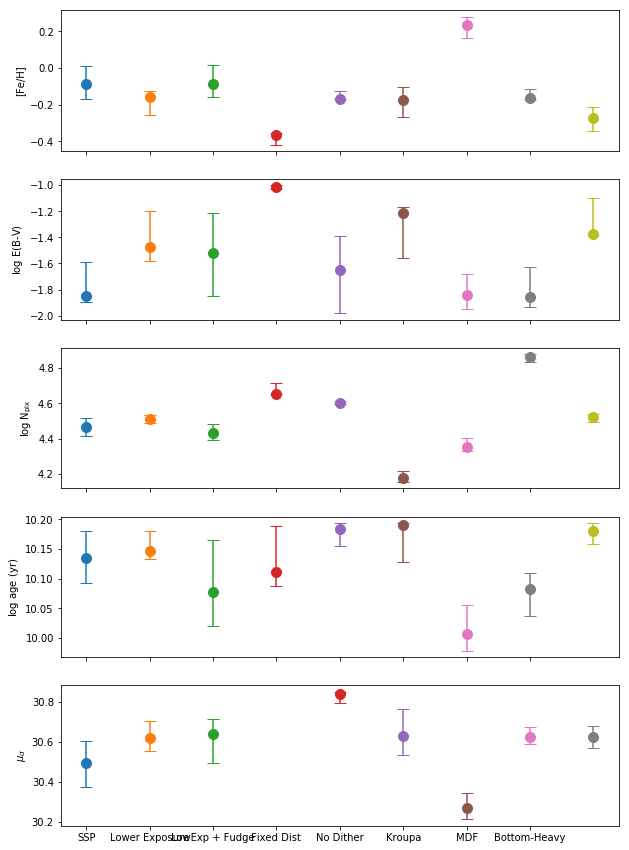

In [50]:
fig, axes = plt.subplots(nrows=5, figsize=(10, 15), sharex=True)
gal = 'M87'
for i,m in enumerate([9, 10, 11, 12, 13, 14, 15, 16, 17]):
    r = results[f'{gal}_m{m}']
    if m == 12:
        r.plot_errorbars(axes[:-1], x=i)
    else:
        r.plot_errorbars(axes, x=i)
for i, a in enumerate(axes):
    a.set_ylabel(r.labels[i])
axes[-1].set_xticks([0, 1, 2, 3, 4, 5, 6, 7])
axes[-1].set_xticklabels(['SSP', 'Lower Exposure', 'LowExp + Fudge', 'Fixed Dist', 'No Dither', 'Kroupa', 'MDF', 'Bottom-Heavy', 'PSF'])

In [66]:
g = ppy.galaxy.SSPSimple(np.array([0.0, -5.0, 0.0, 10.0]))
g.distance_model.dmod = 0.0

In [67]:
imf, mags = iso_models['M87'].model_galaxy(g, downsample=1)

In [68]:
x = np.cumsum(imf/imf.sum())

In [76]:
i = np.array([np.min(np.where(x >= d)[0]) for d in np.arange(0., 1.0, 0.1)])

In [77]:
i

array([ 0,  2,  4,  6,  9, 12, 14, 19, 30, 70])

(20, -5.7208074)

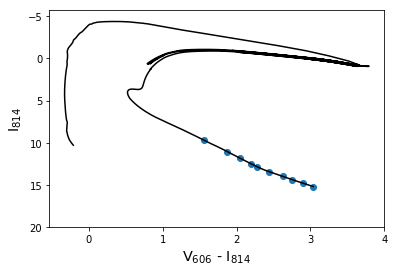

In [81]:
fig, ax = plt.subplots()
ppy.plotting.plot_isochrone(iso_models['M87'], axes=ax, dmod=0.0, alpha=0.)
ax.scatter(mags[1][i]-mags[0][i], mags[1][i])
ax.plot(mags[1]-mags[0], mags[1], 'k-')
ax.set_ylim(ymin=20)


In [82]:
filters['M87'][0].red_per_ebv

1.536

In [84]:
filters['M87'][1].red_per_ebv - filters['M87'][0].red_per_ebv

0.935

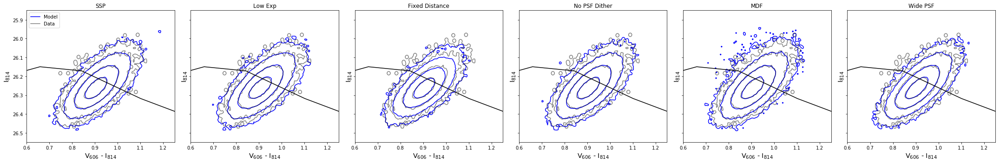

In [52]:
gal = 'M87'
fig, axes = plt.subplots(ncols=6, figsize=(30, 5), sharex=True, sharey=True)
for i, m in enumerate([9, 10, 12, 13, 15, 17]):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
for a in axes:
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m4'], ax=a, color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=a, dmod=dmods[gal])
for i, k in enumerate(['SSP', 'Low Exp', 'Fixed Distance', 'No PSF Dither', 'MDF', 'Wide PSF']):
    axes[i].set_title(k)
axes[0].set_xlim([0.6, 1.25])
axes[0].set_ylim([26.55, 25.85])
axes[0].legend(loc=2)
plt.tight_layout()

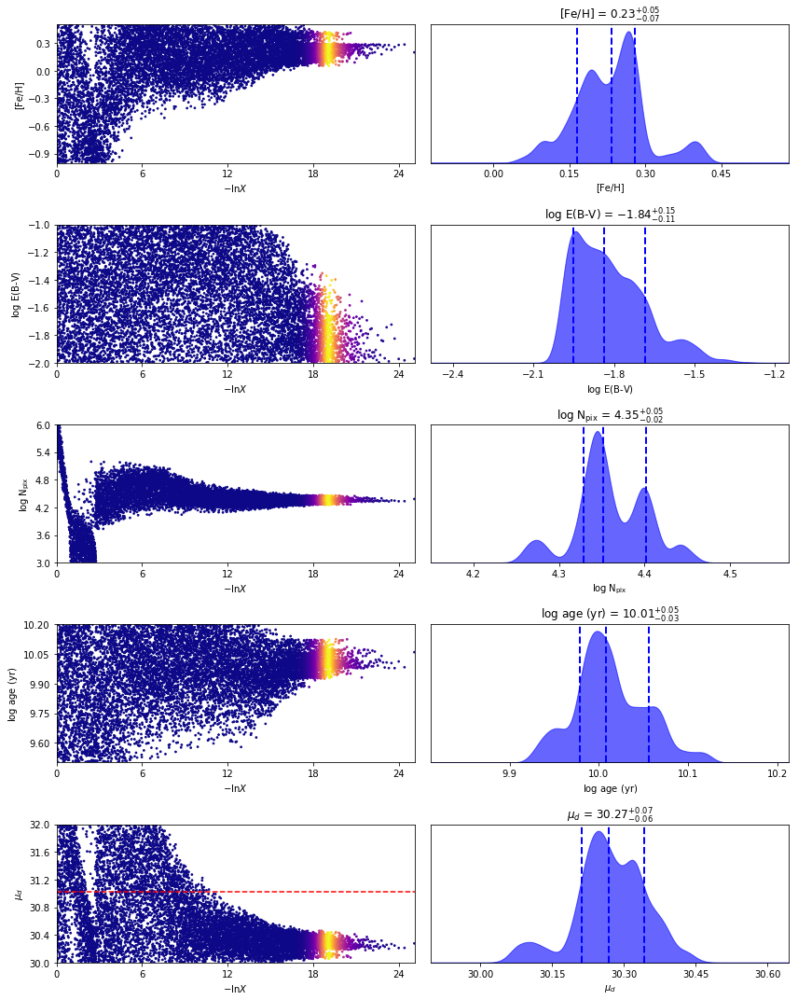

In [53]:
fig, axes = results['M87_m15'].plot_trace();
axes[-1,0].axhline(y=dmods['M87'], ls='--', color='r')
axes[-1,1].axvline(x=dmods['M87'], ls='--', color='r')
plt.tight_layout();

In [55]:
radii['M87_m4'] * 0.05 / 60.

1.5726208468076235

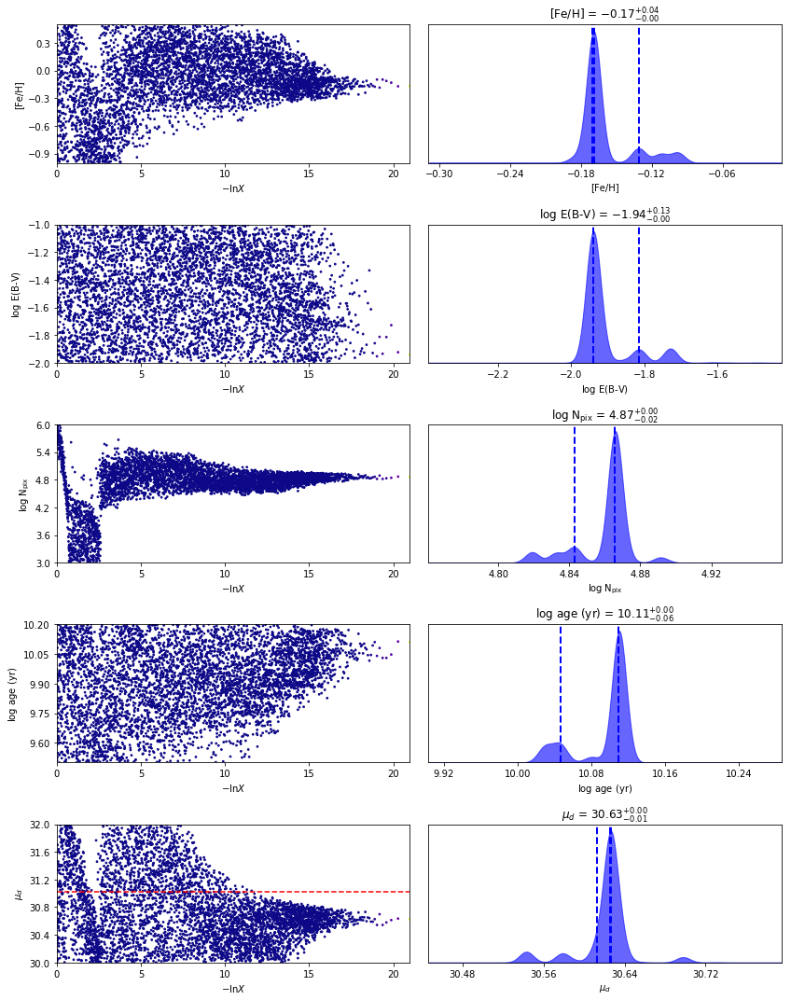

In [22]:
fig, axes = results['M87_m16'].plot_trace();
axes[-1,0].axhline(y=dmods['M87'], ls='--', color='r')
axes[-1,1].axvline(x=dmods['M87'], ls='--', color='r')
plt.tight_layout();

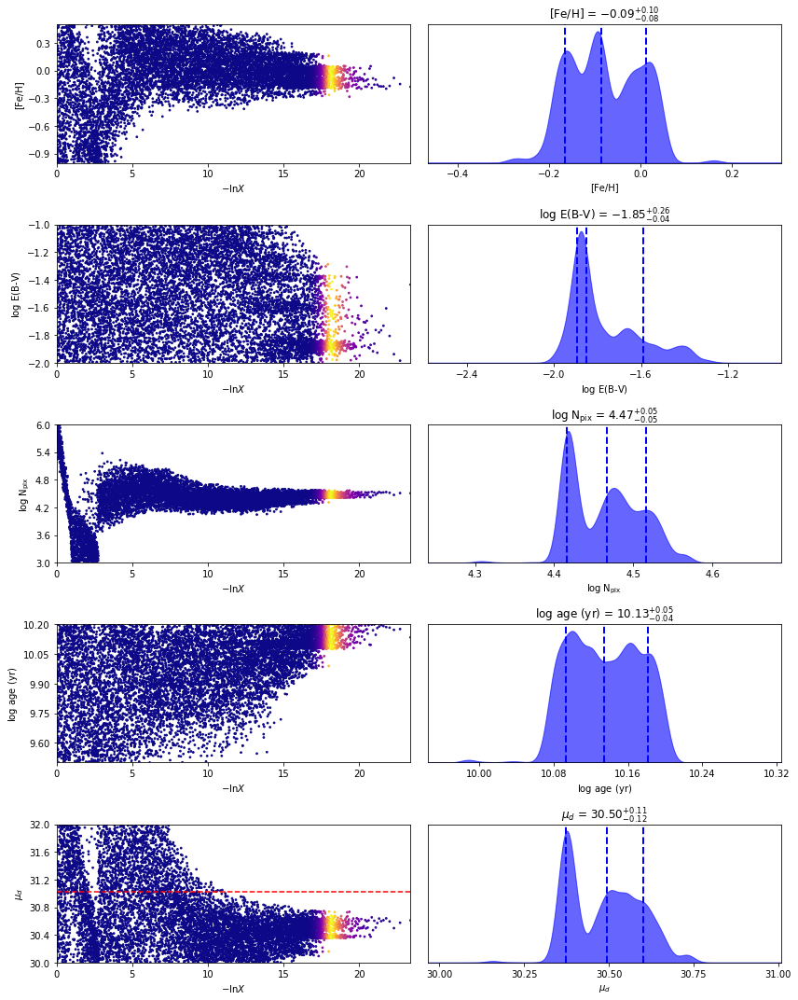

In [15]:
fig, axes = results['M87_m9'].plot_trace();
axes[-1,0].axhline(y=dmods['M87'], ls='--', color='r')
axes[-1,1].axvline(x=dmods['M87'], ls='--', color='r')
plt.tight_layout();

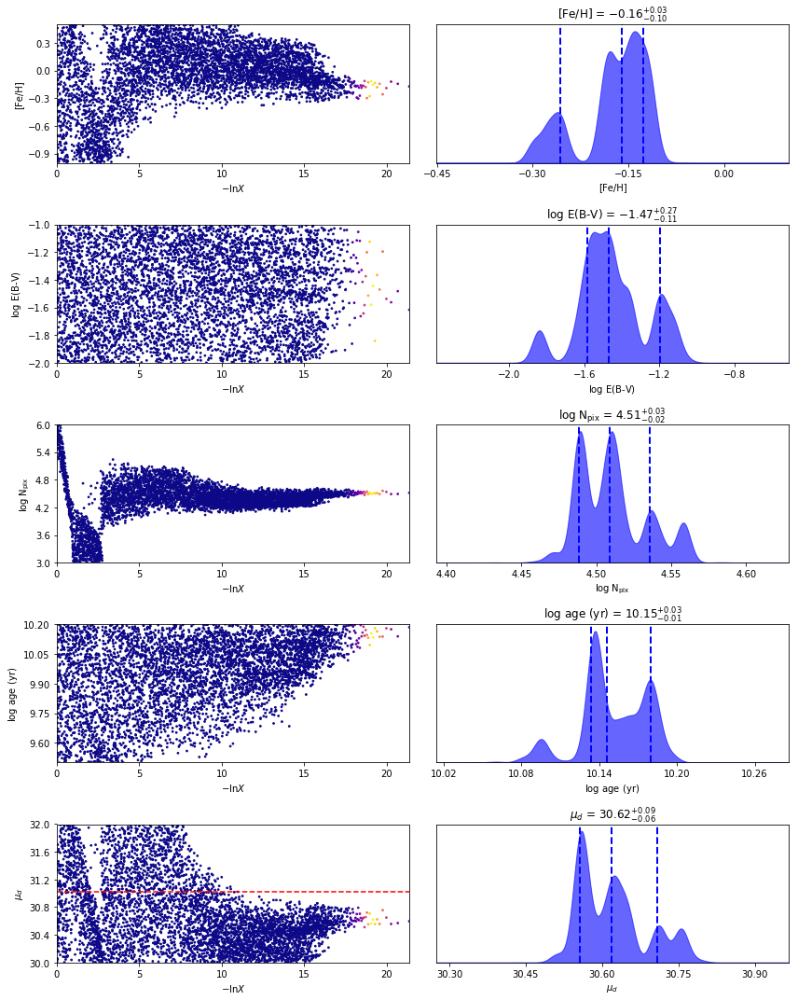

In [16]:
fig, axes = results['M87_m10'].plot_trace();
axes[-1,0].axhline(y=dmods['M87'], ls='--', color='r')
axes[-1,1].axvline(x=dmods['M87'], ls='--', color='r')
plt.tight_layout();

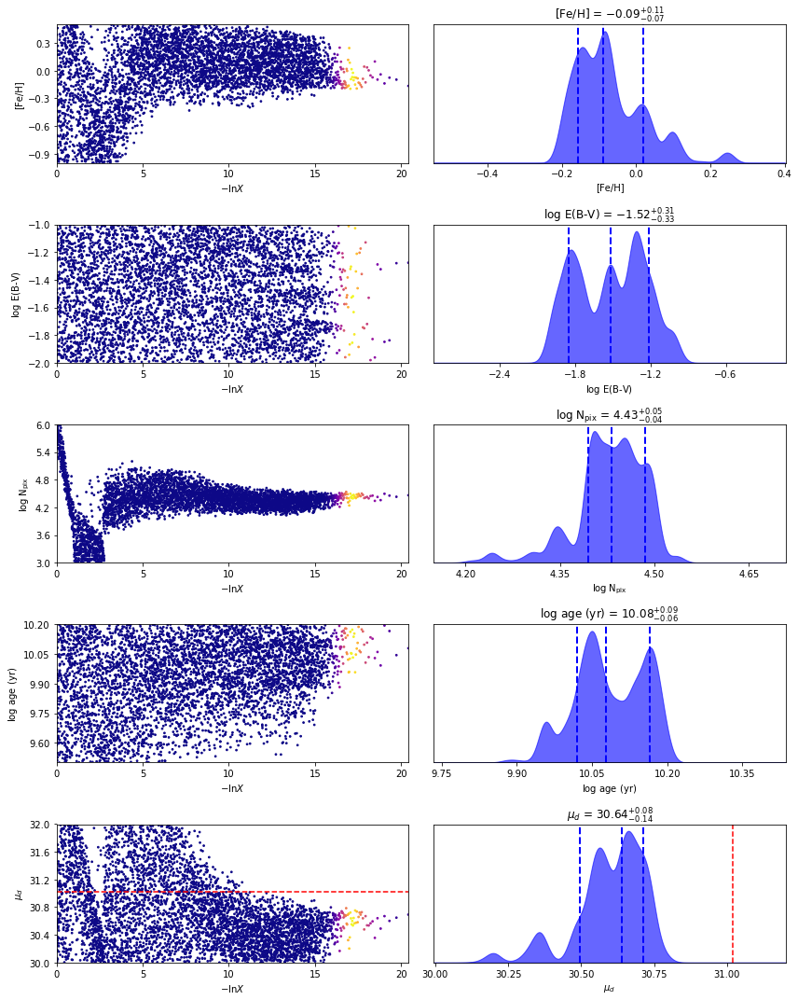

In [17]:
fig, axes = results['M87_m11'].plot_trace();
axes[-1,0].axhline(y=dmods['M87'], ls='--', color='r')
axes[-1,1].axvline(x=dmods['M87'], ls='--', color='r')
plt.tight_layout();

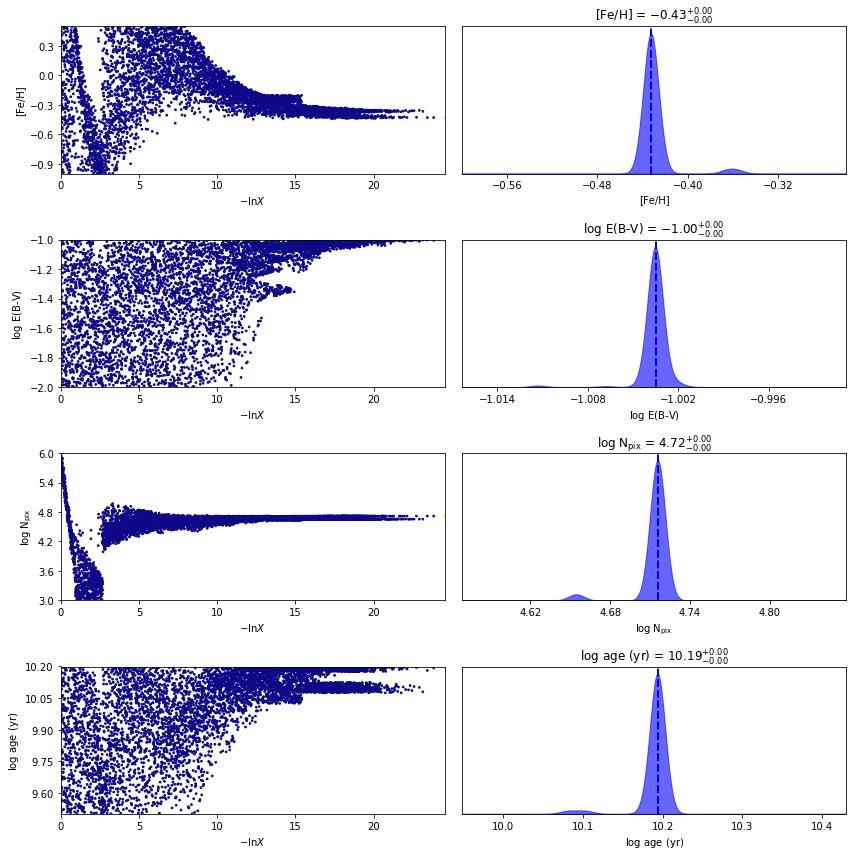

In [19]:
fig, axes = results['M87_m12'].plot_trace();
# axes[-1,0].axhline(y=dmods['M87'], ls='--', color='r')
# axes[-1,1].axvline(x=dmods['M87'], ls='--', color='r')
plt.tight_layout();

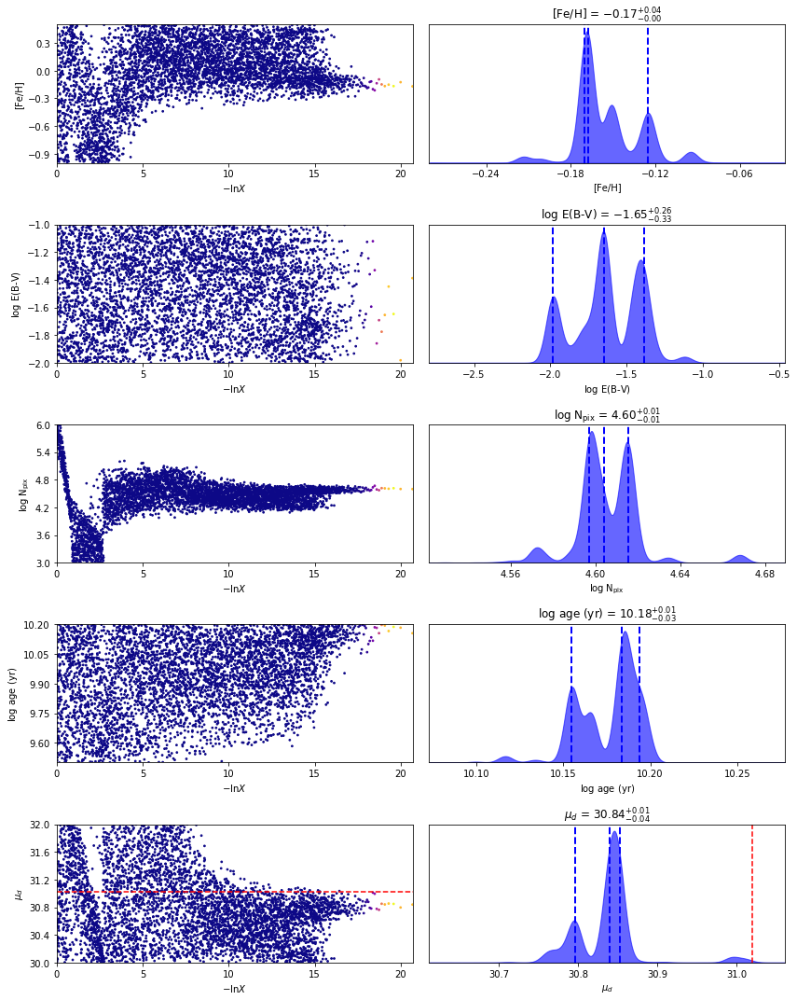

In [18]:
fig, axes = results['M87_m13'].plot_trace();
axes[-1,0].axhline(y=dmods['M87'], ls='--', color='r')
axes[-1,1].axvline(x=dmods['M87'], ls='--', color='r')
plt.tight_layout();

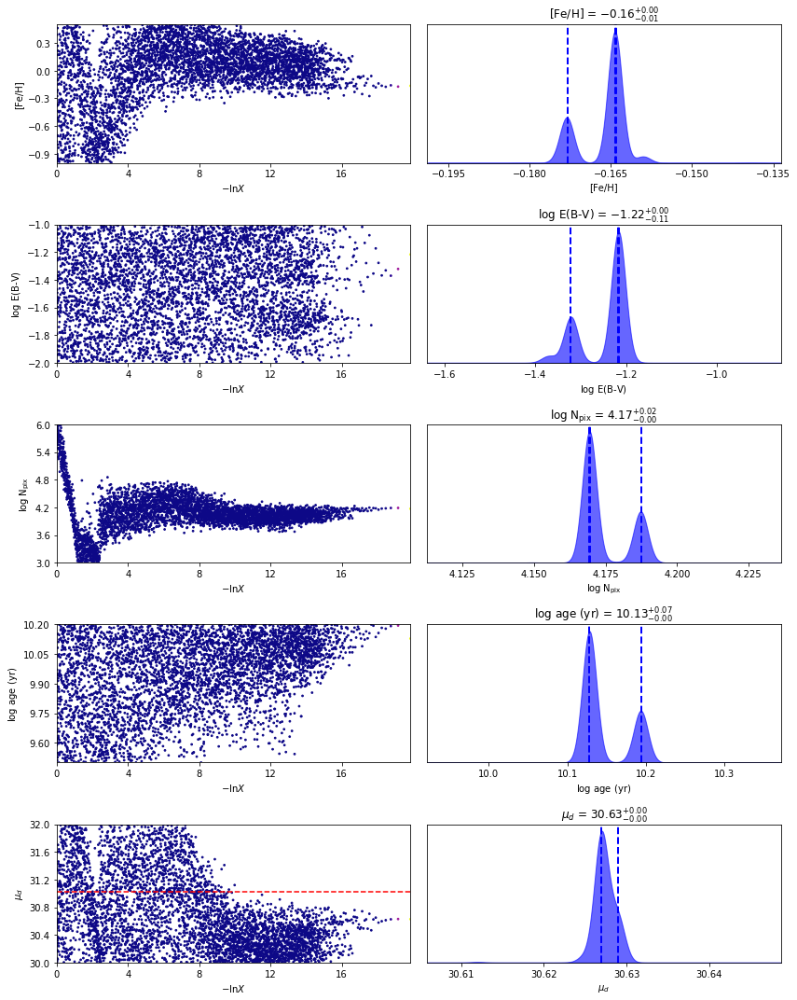

In [19]:
fig, axes = results['M87_m14'].plot_trace();
axes[-1,0].axhline(y=dmods['M87'], ls='--', color='r')
axes[-1,1].axvline(x=dmods['M87'], ls='--', color='r')
plt.tight_layout();

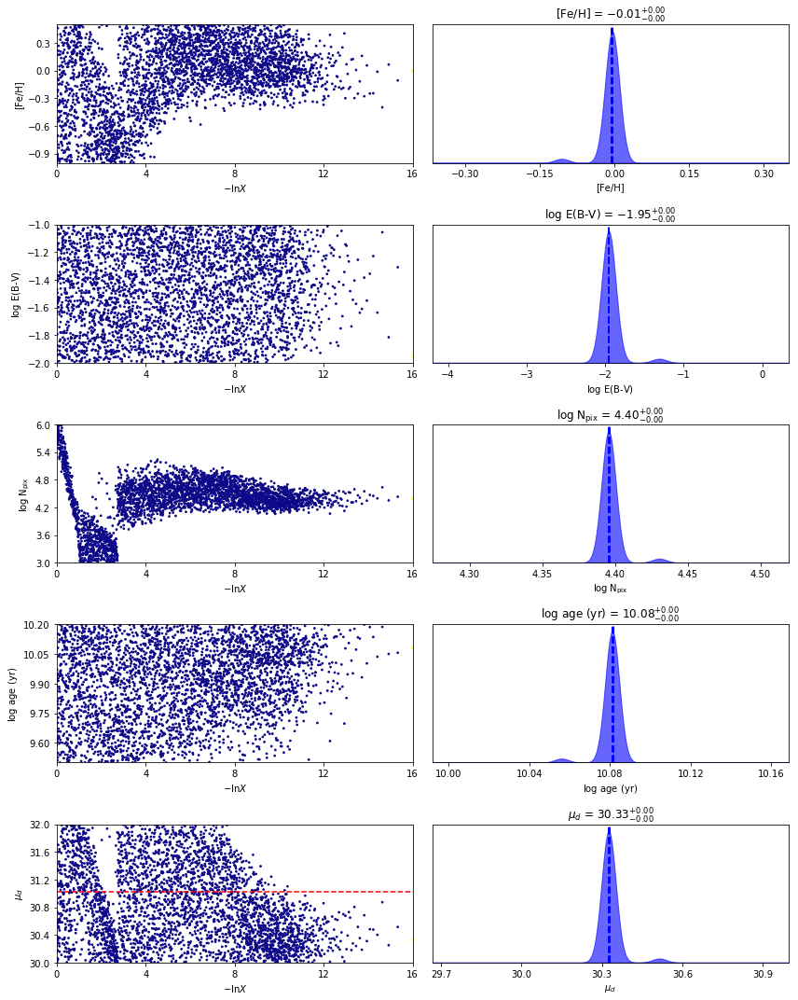

In [12]:
fig, axes = results['M87_m17'].plot_trace();
axes[-1,0].axhline(y=dmods['M87'], ls='--', color='r')
axes[-1,1].axvline(x=dmods['M87'], ls='--', color='r')
plt.tight_layout();

In [ ]:
fig, axes = results['M49_m10'].plot_trace();
axes[-1,0].axhline(y=dmods['M49'], ls='--', color='r')
axes[-1,1].axvline(x=dmods['M49'], ls='--', color='r')
plt.tight_layout();

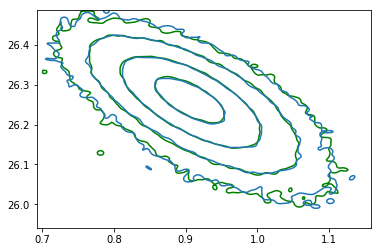

In [29]:
fig, [ax] = ppy.plotting.plot_pcmd_contours(pcmds['M87_m13'], color='g')
fig, [ax] = ppy.plotting.plot_pcmd_contours(pcmds['M87_m14'], ax=ax)
fig, [ax] = ppy.plotting.plot_pcmd_contours(pcmds['M87_m14'], ax=ax)



In [30]:
def distance_uncertainty(dmod, percent=0.1):
    x = ppy.distancemodels.dmod_to_mpc(dmod)
    return 0.5*(ppy.distancemodels.mpc_to_dmod(x*(1+percent)) - ppy.distancemodels.mpc_to_dmod(x*(1-percent)))

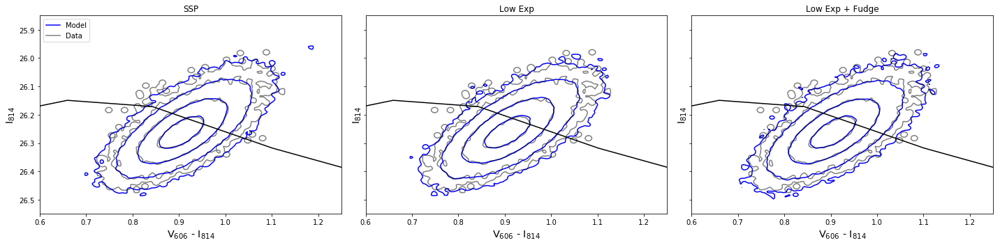

In [18]:
gal = 'M87'
fig, axes = plt.subplots(ncols=3, figsize=(20, 5), sharex=True, sharey=True)
for i, m in enumerate([9, 10, 11]):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
for a in axes:
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m4'], ax=a, color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=a, dmod=dmods[gal])
for i, k in enumerate(['SSP', 'Low Exp', 'Low Exp + Fudge']):
    axes[i].set_title(k)
axes[0].set_xlim([0.6, 1.25])
axes[0].set_ylim([26.55, 25.85])
axes[0].legend(loc=2)
plt.tight_layout()

In [31]:
distance_uncertainty(30.)

0.2178754392972504

In [32]:
distance_uncertainty(31.)

0.2178754392972504

In [33]:
distance_uncertainty(33.)

0.21787543929725217

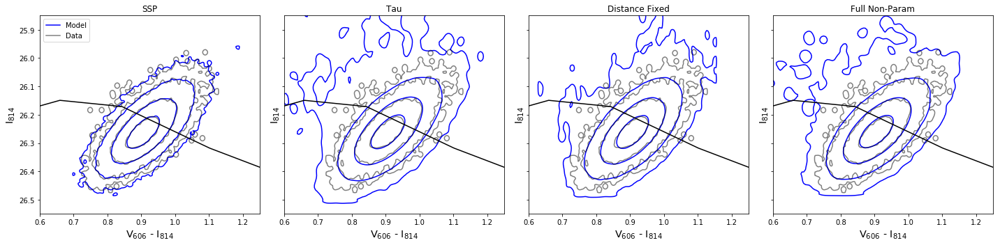

In [11]:
gal = 'M87'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=True)
for i, m in enumerate([9, 8, 7, 4]):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
for a in axes:
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m4'], ax=a, color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=a, dmod=dmods[gal])
for i, k in enumerate(['SSP', 'Tau', 'Distance Fixed', 'Full Non-Param']):
    axes[i].set_title(k)
axes[0].set_xlim([0.6, 1.25])
axes[0].set_ylim([26.55, 25.85])
axes[0].legend(loc=2)
plt.tight_layout()

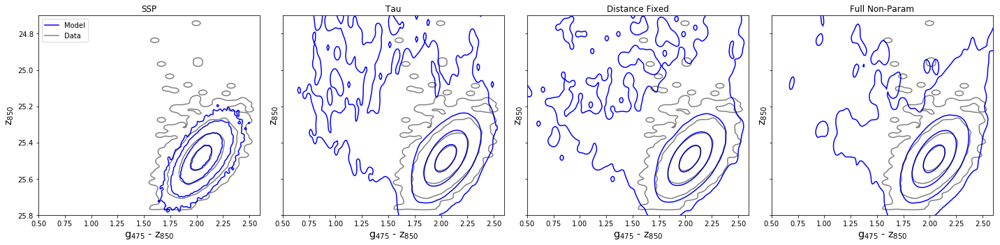

In [12]:
gal = 'M49'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=True)
for i, m in enumerate([9, 8, 7, 4]):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
for a in axes:
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m4'], ax=a, color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=a, dmod=dmods[gal])
for i, k in enumerate(['SSP', 'Tau', 'Distance Fixed', 'Full Non-Param']):
    axes[i].set_title(k)
axes[0].set_xlim([0.5, 2.6])
axes[0].set_ylim([25.8, 24.7])
axes[0].legend(loc=2)
plt.tight_layout()

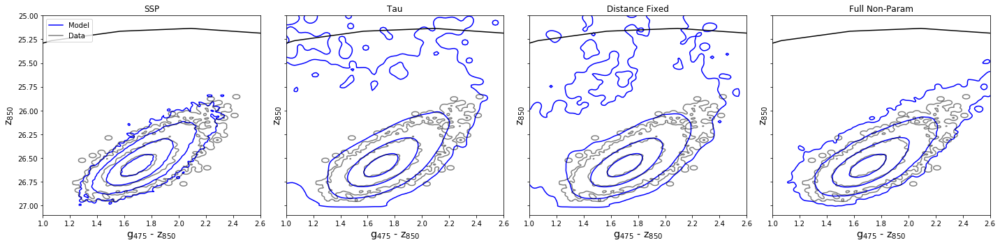

In [25]:
gal = 'NGC3377'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=True)
for i, m in enumerate([9, 8, 7, 4]):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
for a in axes:
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m4'], ax=a, color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=a, dmod=dmods[gal])
for i, k in enumerate(['SSP', 'Tau', 'Distance Fixed', 'Full Non-Param']):
    axes[i].set_title(k)
axes[0].set_xlim([1.0, 2.6])
axes[0].set_ylim([27.1, 25.0])
axes[0].legend(loc=2)
plt.tight_layout()

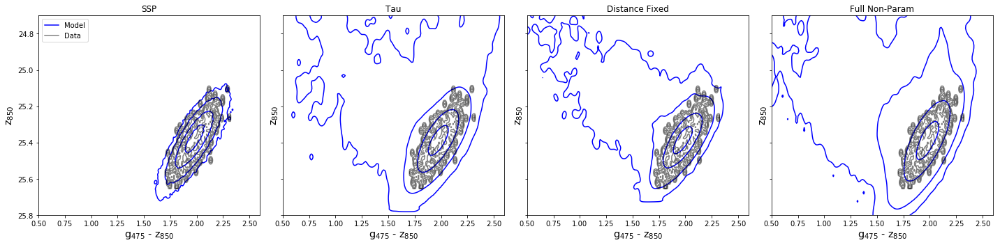

In [14]:
gal = 'NGC4993'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=True)
for i, m in enumerate([9, 8, 7, 4]):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
for a in axes:
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m4'], ax=a, color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=a, dmod=dmods[gal])
for i, k in enumerate(['SSP', 'Tau', 'Distance Fixed', 'Full Non-Param']):
    axes[i].set_title(k)
axes[0].set_xlim([0.5, 2.6])
axes[0].set_ylim([25.8, 24.7])
axes[0].legend(loc=2)
plt.tight_layout()

# Distance Fixed / Free

In [52]:
results['M49_m4'].max_logl = -170.

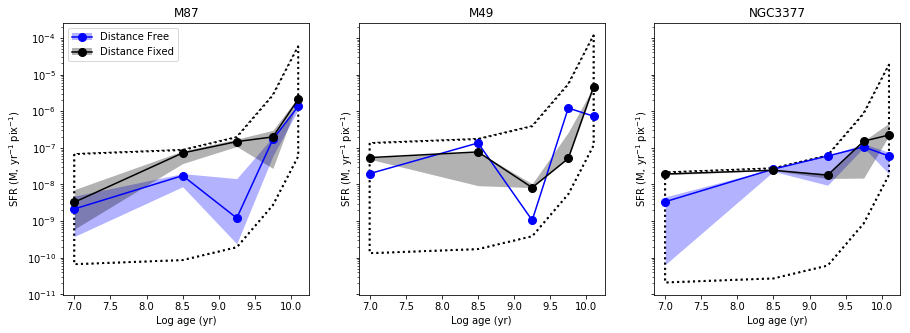

In [19]:
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, sharex=True, sharey=True)
for i, g in enumerate(['M87', 'M49', 'NGC3377']):
    ax, (line1, _, fill1, _, _) = results[f'{g}_m4'].plot_sfr(ax=axes[i], color='b', legend=False, all_ages=False)
    ax, (line2, _, fill2, _, _) = results[f'{g}_m7'].plot_sfr(ax=axes[i], color='k', legend=False, all_ages=False)
    if i == 0:
        ax.legend(((line1, fill1), (line2, fill2)), ('Distance Free', 'Distance Fixed'), loc=2)
    axes[i].set_title(g)
plt.savefig('figures/Distance_SFHs.pdf')

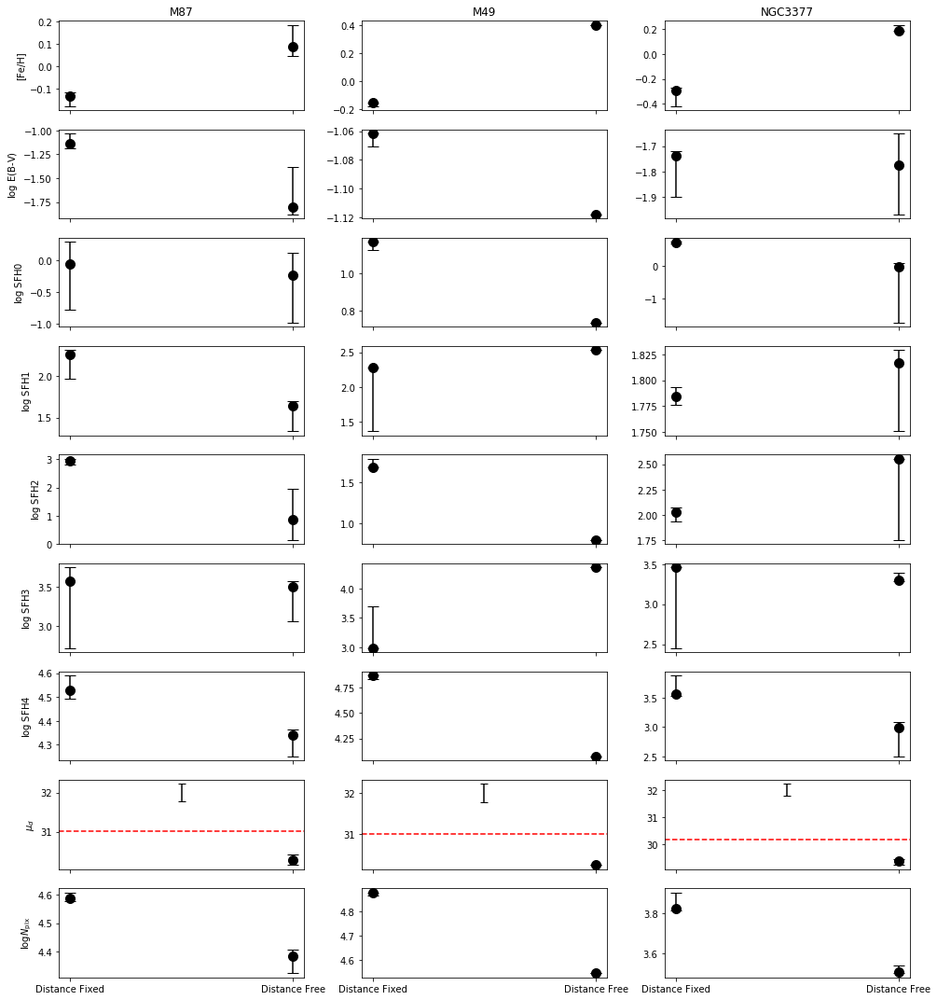

In [20]:
fig, axes = plt.subplots(nrows=9, ncols=3, figsize=(14, 15), sharex=True, sharey=False)
for i, g in enumerate(['M87', 'M49','NGC3377']):
    results[f'{g}_m7'].plot_errorbars([axes[0,i], axes[1,i], axes[2,i], axes[3,i], axes[4,i], axes[5,i], axes[6,i], axes[8,i]], x=0, color='k')
    results[f'{g}_m4'].plot_errorbars(axes[:, i], x=1, color='k')
    axes[0, i].set_title(g)
    axes[-2, i].axhline(y=dmods[g], ls='--', color='r')
    axes[-1, i].set_xticks([0, 1])
    axes[-1, i].set_xticklabels(['Distance Fixed', 'Distance Free'])
for ax in axes[-2]:
    ax.errorbar(x=0.5, y=32.0, yerr=0.22, marker='', color='k', capsize=4)
for i, ax in enumerate(axes[:,0]):
    ax.set_ylabel(results['NGC3377_m3'].labels[i])
plt.tight_layout()
plt.savefig('figures/Distance_Errorbars.pdf')

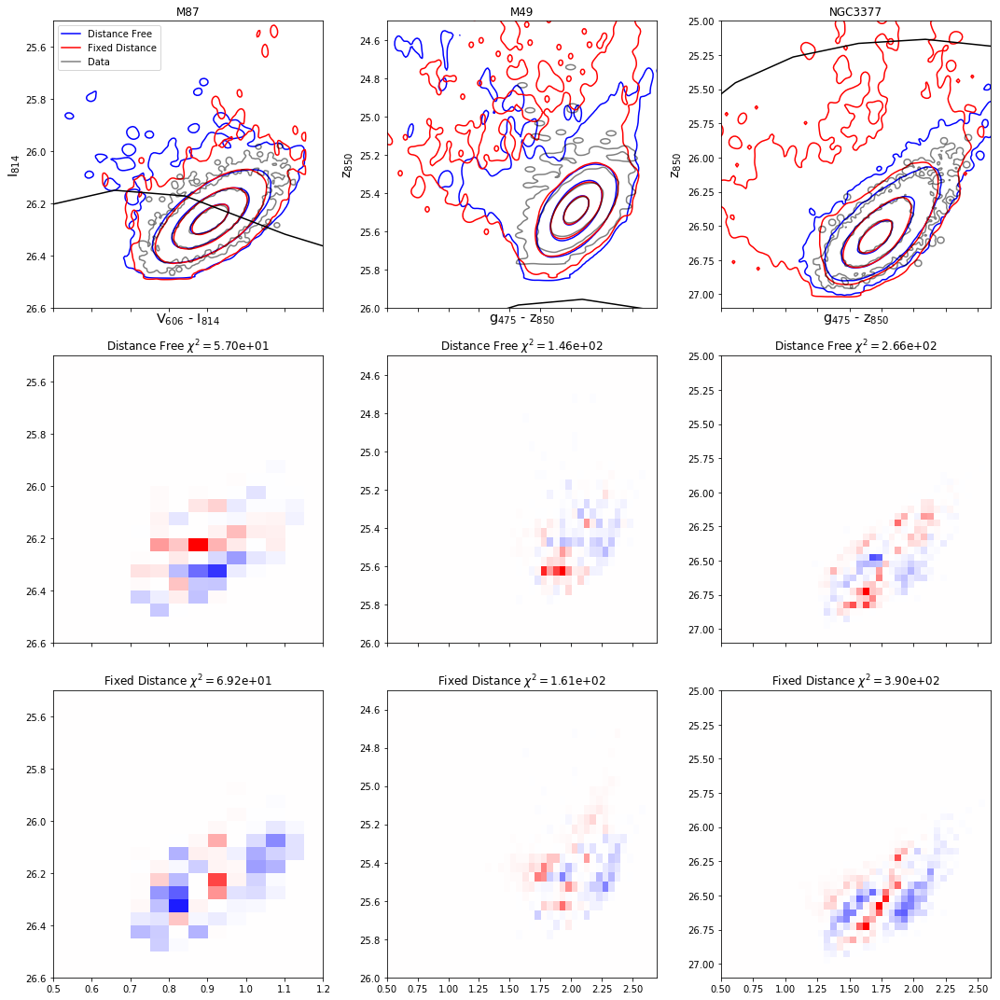

In [15]:
fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(15, 15), sharex='col', sharey='col')
norm=None
for i, g in enumerate(['M87', 'M49', 'NGC3377']):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{g}_m4'], ax=axes[0,i], color='b', alpha=1.0, label='Distance Free', keep_limits=False)
    ppy.plotting.plot_pcmd_contours(pcmds[f'{g}_m7'], ax=axes[0,i], color='r', alpha=1.0, label='Fixed Distance', keep_limits=True)
    ppy.plotting.plot_pcmd_contours(data[f'{g}_m4'], ax=axes[0,i], color='k', alpha=0.5, label='Data', keep_limits=True)
    ppy.plotting.plot_isochrone(iso_models[g], axes=axes[0,i], dmod=dmods[g])
    axes[0,i].set_title(g)
    bins = [ np.arange(20., 30., 0.05), np.arange(-0.5, 3.0, 0.05)]
    a, ll, bins, norm = ppy.plotting.plot_pcmd_residual(pcmds[f'{g}_m4'], data[f'{g}_m4'], ax=axes[1,i], bins=bins, norm=norm,
                                                       title='Distance Free')
    a, ll, bins, norm = ppy.plotting.plot_pcmd_residual(pcmds[f'{g}_m7'], data[f'{g}_m7'], ax=axes[2,i], bins=bins, norm=norm,
                                                       title='Fixed Distance')
    norm = None
axes[0,0].set_xlim([0.5, 1.2])
axes[0,0].set_ylim([26.6, 25.5])
axes[0,1].set_xlim([0.5, 2.7])
axes[0,1].set_ylim([26.0, 24.5])
axes[0,2].set_xlim([0.5, 2.6])
axes[0,2].set_ylim([27.1, 25.0])
axes[0,0].legend(loc=2)
plt.tight_layout()
plt.savefig('figures/Distance_resids.pdf')

# Radial Trends

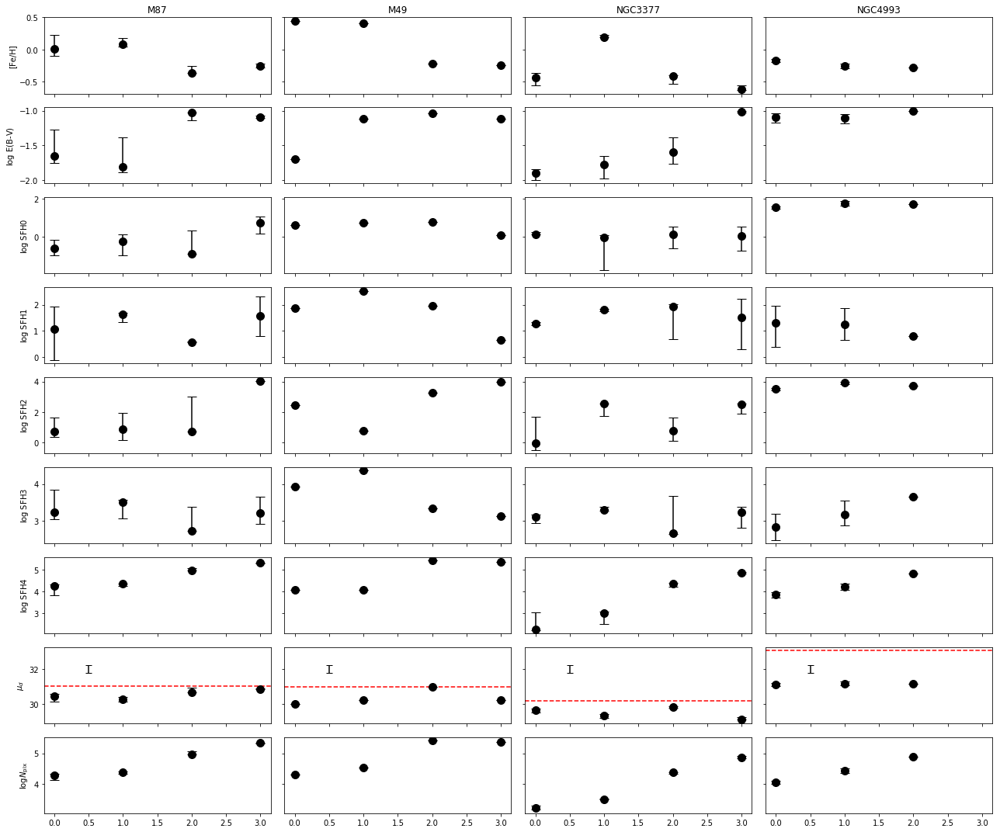

In [24]:
fig, axes = plt.subplots(nrows=9, ncols=4, figsize=(18, 15), sharex=True, sharey='row')
for i, g in enumerate(['M87', 'M49','NGC3377', 'NGC4993']):
    for j, m in enumerate([3,4,5,6]):
        k = f'{g}_m{m}'
        if k in results:
            results[k].plot_errorbars(axes[:, i], x=j, color='k')
    axes[0, i].set_title(g)
    axes[-2, i].axhline(y=dmods[g], ls='--', color='r')
for ax in axes[-2]:
    ax.errorbar(x=0.5, y=32.0, yerr=0.22, marker='', color='k', capsize=4)
for i, ax in enumerate(axes[:,0]):
    ax.set_ylabel(results['NGC3377_m3'].labels[i])
plt.tight_layout()

In [ ]:
regio

In [64]:
g = "M87"
for m in range(3, 12):
    if m == 7:
        continue
    k = f'{g}_m{m}'
    i = (-2 if m <= 7 else -1)
    print(m, '{:.2f}'.format(dmods[g] - results[k].get_medians()[i]), '{:.2f}'.format(df[g].loc[regions[k]]))

3 0.56 0.01
4 0.73 0.02
5 0.36 0.07
6 0.16 0.06
8 0.61 0.02
9 0.52 0.02
10 0.40 0.02
11 0.38 0.02


In [65]:
g = "M49"
for m in range(3, 10):
    if m == 7:
        continue
    k = f'{g}_m{m}'
    i = (-2 if m <= 7 else -1)
    print(m, '{:.2f}'.format(dmods[g] - results[k].get_medians()[i]), '{:.2f}'.format(df[g].loc[regions[k]]))

3 0.97 0.02
4 0.74 0.03
5 -0.01 0.05
6 0.75 0.11
8 0.39 0.03
9 0.07 0.03


In [66]:
g = "NGC3377"
for m in range(3, 10):
    if m == 7:
        continue
    k = f'{g}_m{m}'
    i = (-2 if m <= 7 else -1)
    print(m, '{:.2f}'.format(dmods[g] - results[k].get_medians()[i]), '{:.2f}'.format(df[g].loc[regions[k]]))

3 0.49 0.02
4 0.81 0.01
5 0.33 0.09
6 1.05 0.09
8 0.12 0.01
9 0.33 0.01


In [49]:
df = pd.read_csv('results/regions_delta_red.csv', index_col=0)

In [50]:
df.head()

,NGC4993,NGC3377,M49,M87
4,0.008434,0.083818,0.008316,-0.000549
5,0.065420,0.048716,-0.006535,0.004103
6,0.007200,0.022675,0.010172,0.037529
7,-0.001389,0.030771,0.028580,0.008705
8,-0.006313,0.047438,0.000496,0.000872


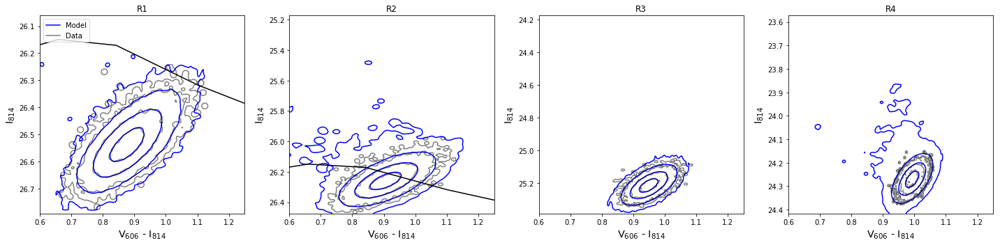

In [22]:
gal = 'M87'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=False)
for i, m in enumerate(['3', '4', '5', '6']):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model', keep_limits=False)
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m{m}'], ax=axes[i], color='k', alpha=0.5, label='Data', keep_limits=True)
    ppy.plotting.plot_isochrone(iso_models[gal], axes=axes[i], dmod=dmods[gal])
for i, k in enumerate(['R1', 'R2', 'R3', 'R4']):
    axes[i].set_title(k)
axes[0].set_xlim([0.6, 1.25])
# axes[0].set_ylim([26.9, 23.9])
axes[0].legend(loc=2)
plt.tight_layout()

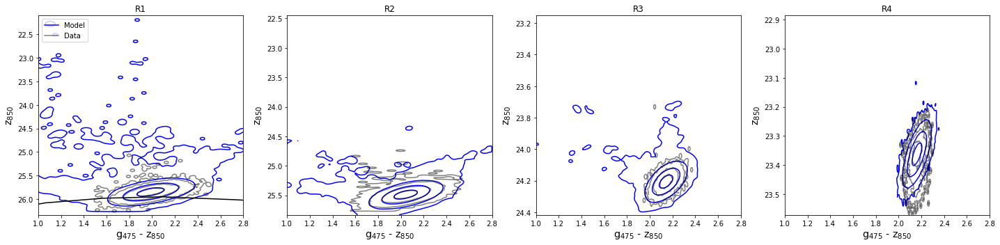

In [23]:
gal = 'M49'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=False)
for i, m in enumerate(['3', '4', '5', '6']):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model', keep_limits=False)
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m{m}'], ax=axes[i], color='k', alpha=0.5, label='Data', keep_limits=True)
    ppy.plotting.plot_isochrone(iso_models[gal], axes=axes[i], dmod=dmods[gal])
for i, k in enumerate(['R1', 'R2', 'R3', 'R4']):
    axes[i].set_title(k)
axes[0].set_xlim([1., 2.8])
# axes[0].set_ylim([26.9, 23.9])
axes[0].legend(loc=2)
plt.tight_layout()

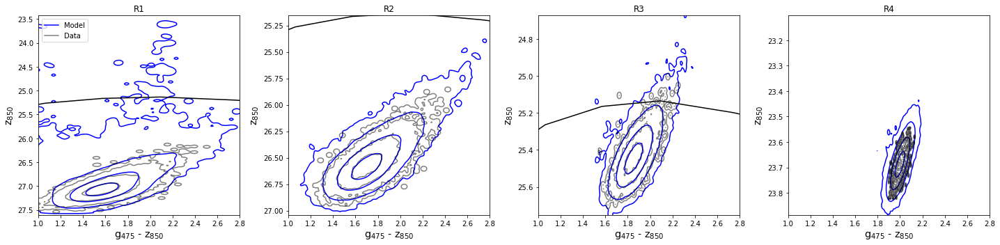

In [24]:
gal = 'NGC3377'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=False)
for i, m in enumerate(['3', '4', '5', '6']):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model', keep_limits=False)
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m{m}'], ax=axes[i], color='k', alpha=0.5, label='Data', keep_limits=True)
    ppy.plotting.plot_isochrone(iso_models[gal], axes=axes[i], dmod=dmods[gal])
for i, k in enumerate(['R1', 'R2', 'R3', 'R4']):
    axes[i].set_title(k)
axes[0].set_xlim([1., 2.8])
# axes[0].set_ylim([26.9, 23.9])
axes[0].legend(loc=2)
plt.tight_layout()

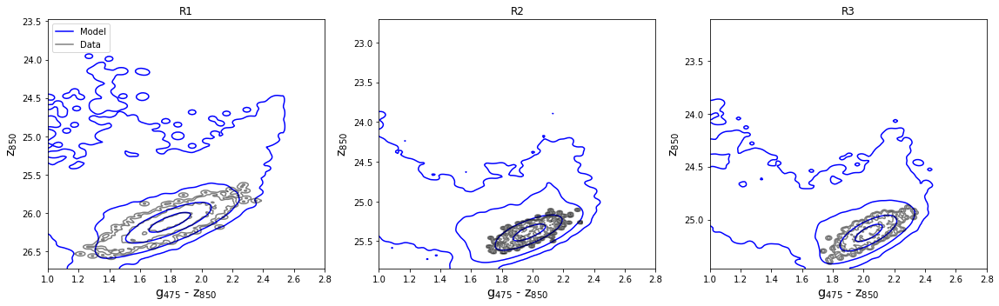

In [25]:
gal = 'NGC4993'
fig, axes = plt.subplots(ncols=3, figsize=(16, 5), sharex=True, sharey=False)
for i, m in enumerate(['3', '4', '5',]):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model', keep_limits=False)
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m{m}'], ax=axes[i], color='k', alpha=0.5, label='Data', keep_limits=True)
    ppy.plotting.plot_isochrone(iso_models[gal], axes=axes[i], dmod=dmods[gal])
for i, k in enumerate(['R1', 'R2', 'R3']):
    axes[i].set_title(k)
axes[0].set_xlim([1., 2.8])
# axes[0].set_ylim([26.9, 23.9])
axes[0].legend(loc=2)
plt.tight_layout()

# Angular Trends

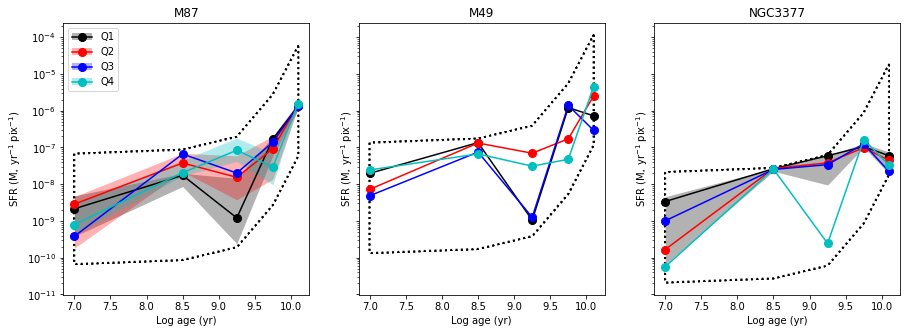

In [21]:
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, sharex=True, sharey=True)
for i, g in enumerate(['M87', 'M49', 'NGC3377']):
    ax, (line1, _, fill1, _, _) = results[f'{g}_m4'].plot_sfr(ax=axes[i], color='k', legend=False, all_ages=False)
    ax, (line2, _, fill2, _, _) = results[f'{g}_m4_q1'].plot_sfr(ax=axes[i], color='r', legend=False, all_ages=False)
    ax, (line3, _, fill3, _, _) = results[f'{g}_m4_q2'].plot_sfr(ax=axes[i], color='b', legend=False, all_ages=False)
    ax, (line4, _, fill4, _, _) = results[f'{g}_m4_q3'].plot_sfr(ax=axes[i], color='c', legend=False, all_ages=False)
    if i == 0:
        ax.legend(((line1, fill1), (line2, fill2), (line3, fill3), (line4, fill4)), ('Q1', 'Q2', 'Q3', 'Q4'), loc=2)
    axes[i].set_title(g)
plt.savefig('figures/quadrant_SFHS.pdf')

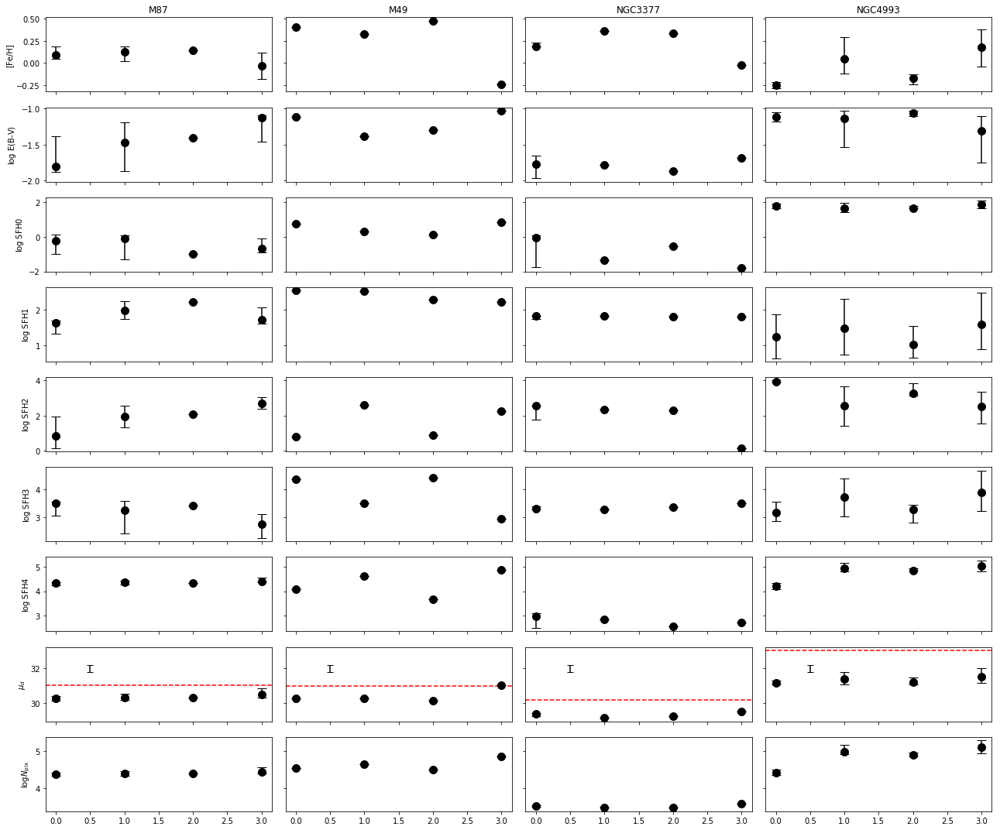

In [18]:
fig, axes = plt.subplots(nrows=9, ncols=4, figsize=(18, 15), sharex=True, sharey='row')
for i, g in enumerate(['M87', 'M49','NGC3377', 'NGC4993']):
    for j, r in enumerate(['', '_q1', '_q2', '_q3']):
        k = f'{g}_m4{r}'
        if k in results:
            results[k].plot_errorbars(axes[:, i], x=j, color='k')
    axes[0, i].set_title(g)
    axes[-2, i].axhline(y=dmods[g], ls='--', color='r')
for ax in axes[-2]:
    ax.errorbar(x=0.5, y=32.0, yerr=0.22, marker='', color='k', capsize=4)
for i, ax in enumerate(axes[:,0]):
    ax.set_ylabel(results['NGC3377_m3'].labels[i])
plt.tight_layout()

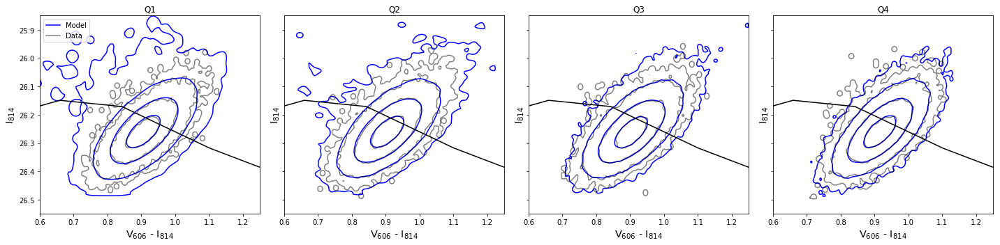

In [27]:
gal = 'M87'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=True)
for i, m in enumerate(['4', '4_q1', '4_q2', '4_q3']):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m{m}'], ax=axes[i], color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=axes[i], dmod=dmods[gal])
for i, k in enumerate(['Q1', 'Q2', 'Q3', 'Q4']):
    axes[i].set_title(k)
axes[0].set_xlim([0.6, 1.25])
axes[0].set_ylim([26.55, 25.85])
axes[0].legend(loc=2)
plt.tight_layout()

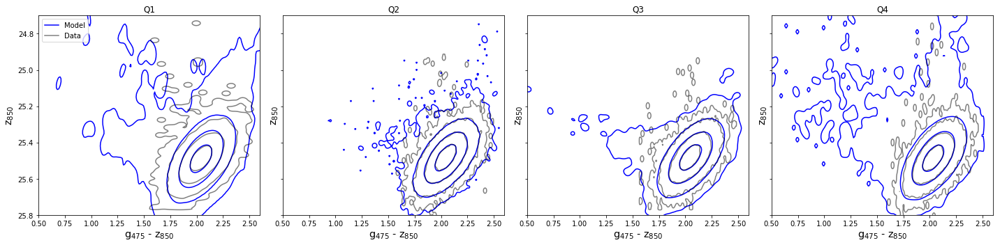

In [28]:
gal = 'M49'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=True)
for i, m in enumerate(['4', '4_q1', '4_q2', '4_q3']):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m{m}'], ax=axes[i], color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=axes[i], dmod=dmods[gal])
for i, k in enumerate(['Q1', 'Q2', 'Q3', 'Q4']):
    axes[i].set_title(k)
axes[0].set_xlim([0.5, 2.6])
axes[0].set_ylim([25.8, 24.7])
axes[0].legend(loc=2)
plt.tight_layout()

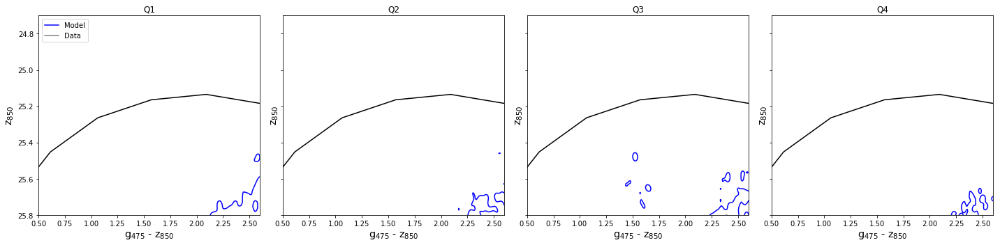

In [29]:
gal = 'NGC3377'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=True)
for i, m in enumerate(['4', '4_q1', '4_q2', '4_q3']):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m{m}'], ax=axes[i], color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=axes[i], dmod=dmods[gal])
for i, k in enumerate(['Q1', 'Q2', 'Q3', 'Q4']):
    axes[i].set_title(k)
axes[0].set_xlim([0.5, 2.6])
axes[0].set_ylim([25.8, 24.7])
axes[0].legend(loc=2)
plt.tight_layout()

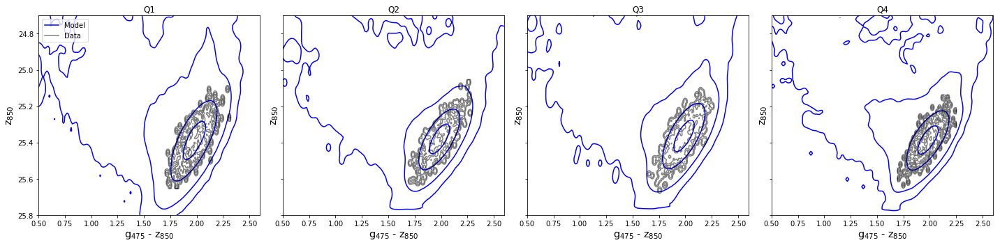

In [30]:
gal = 'NGC4993'
fig, axes = plt.subplots(ncols=4, figsize=(20, 5), sharex=True, sharey=True)
for i, m in enumerate(['4', '4_q1', '4_q2', '4_q3']):
    ppy.plotting.plot_pcmd_contours(pcmds[f'{gal}_m{m}'], ax=axes[i], color='b', alpha=1.0, label='Model')
    ppy.plotting.plot_pcmd_contours(data[f'{gal}_m{m}'], ax=axes[i], color='k', alpha=0.5, label='Data')
    ppy.plotting.plot_isochrone(iso_models[gal], axes=axes[i], dmod=dmods[gal])
for i, k in enumerate(['Q1', 'Q2', 'Q3', 'Q4']):
    axes[i].set_title(k)
axes[0].set_xlim([0.5, 2.6])
axes[0].set_ylim([25.8, 24.7])
axes[0].legend(loc=2)
plt.tight_layout()

# DF2

In [11]:
dmod_20 = ppy.distancemodels.mpc_to_dmod(20.)
dmod_13 = ppy.distancemodels.mpc_to_dmod(13.)
sky_noise = [163.7, 207.1]

In [12]:
dmod_20

31.505149978319906

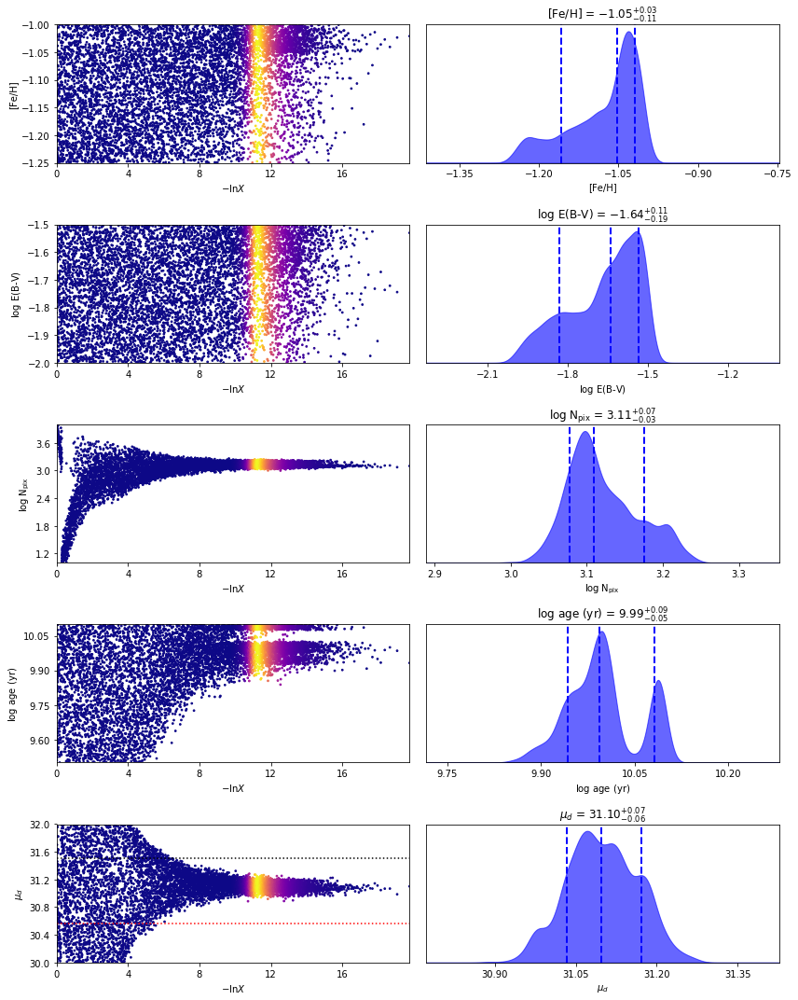

In [42]:
gal = 'DF2'
fig, axes = results[f'{gal}_m1'].plot_trace();
axes[-1,0].axhline(y=dmod_20, color='k', ls=':')
axes[-1,1].axvline(x=dmod_20, color='k', ls=':')
axes[-1,0].axhline(y=dmod_13, color='r', ls=':')
axes[-1,1].axvline(x=dmod_13, color='r', ls=':')
plt.tight_layout()
plt.savefig('figures/DF2_SSP.pdf')

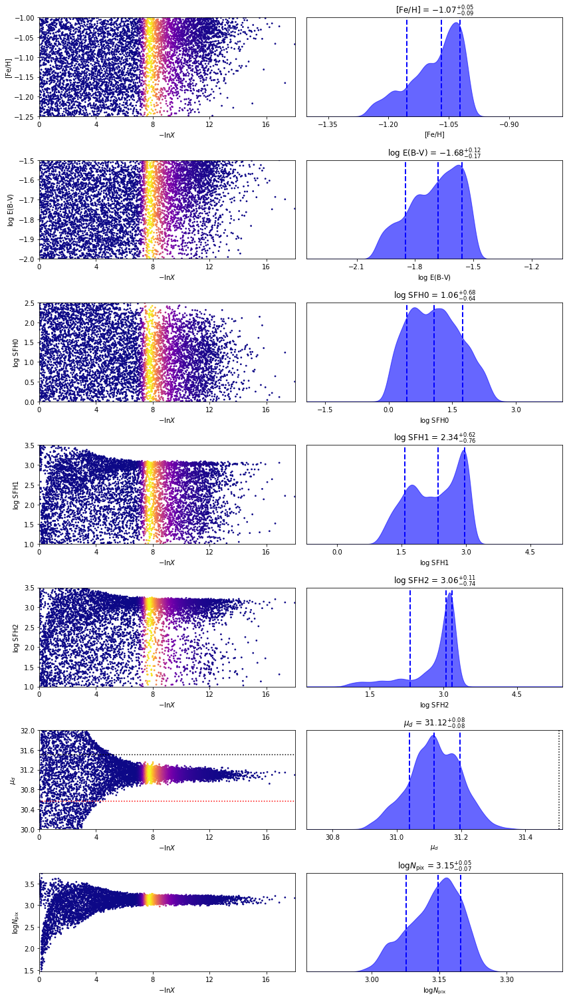

In [43]:
gal = 'DF2'
fig, axes = results[f'{gal}_m2'].plot_trace();
axes[-2,0].axhline(y=dmod_20, color='k', ls=':')
axes[-2,1].axvline(x=dmod_20, color='k', ls=':')
axes[-2,0].axhline(y=dmod_13, color='r', ls=':')
axes[-2,1].axvline(x=dmod_13, color='r', ls=':')
plt.tight_layout()
plt.savefig('figures/DF2_NP.pdf')

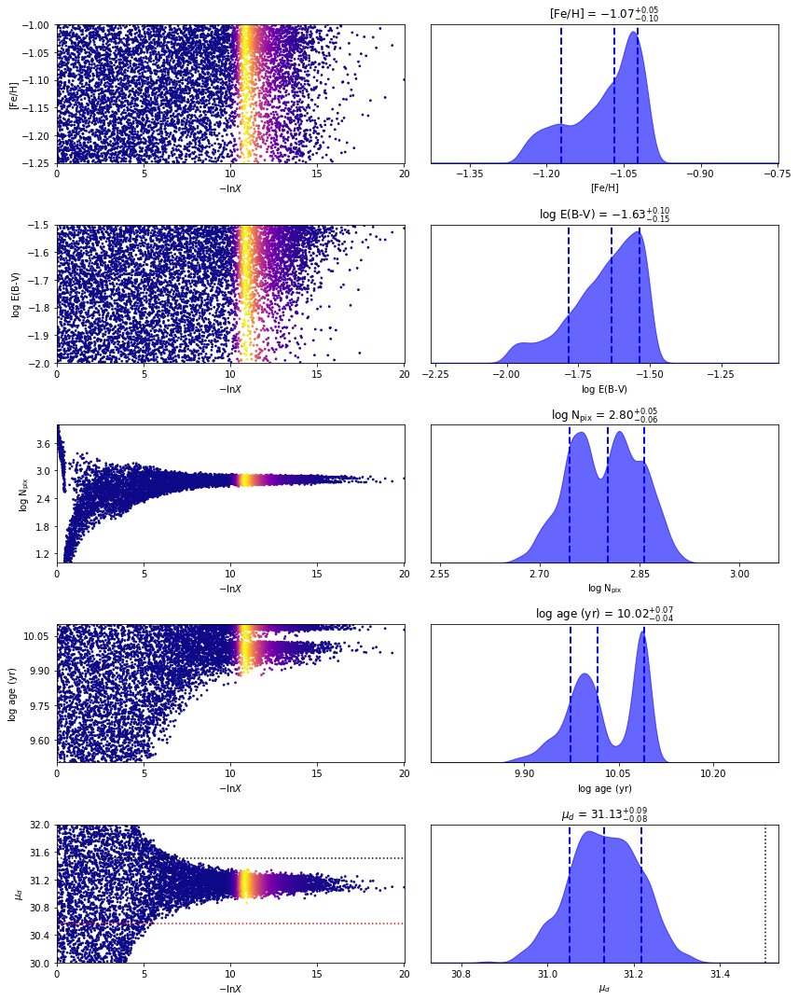

In [44]:
gal = 'DF2'
fig, axes = results[f'{gal}_m3'].plot_trace();
axes[-1,0].axhline(y=dmod_20, color='k', ls=':')
axes[-1,1].axvline(x=dmod_20, color='k', ls=':')
axes[-1,0].axhline(y=dmod_13, color='r', ls=':')
axes[-1,1].axvline(x=dmod_13, color='r', ls=':')
plt.tight_layout()
# plt.savefig('figures/DF2_SSP.pdf')

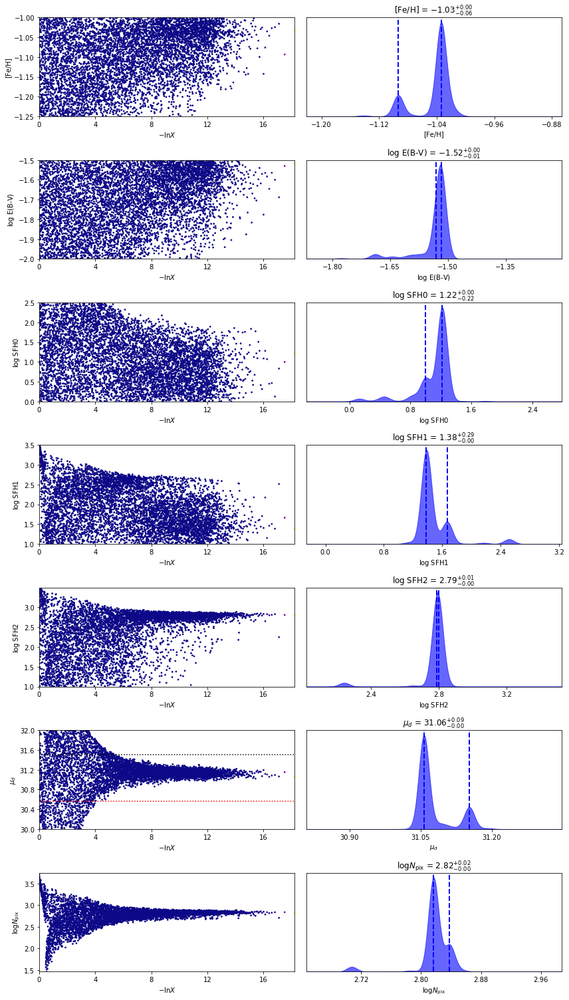

In [45]:
gal = 'DF2'
fig, axes = results[f'{gal}_m4'].plot_trace();
axes[-2,0].axhline(y=dmod_20, color='k', ls=':')
axes[-2,1].axvline(x=dmod_20, color='k', ls=':')
axes[-2,0].axhline(y=dmod_13, color='r', ls=':')
axes[-2,1].axvline(x=dmod_13, color='r', ls=':')
plt.tight_layout()
# plt.savefig('figures/DF2_NP.pdf')

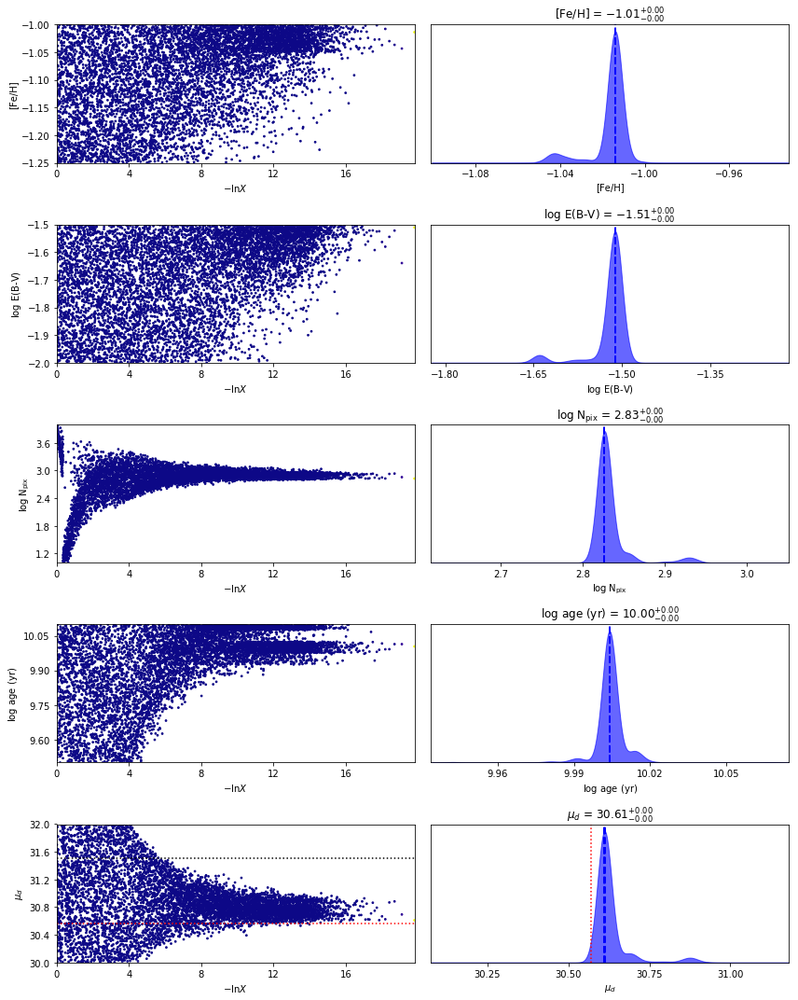

In [13]:
gal = 'DF2'
fig, axes = results[f'{gal}_m5'].plot_trace();
axes[-1,0].axhline(y=dmod_20, color='k', ls=':')
axes[-1,1].axvline(x=dmod_20, color='k', ls=':')
axes[-1,0].axhline(y=dmod_13, color='r', ls=':')
axes[-1,1].axvline(x=dmod_13, color='r', ls=':')
plt.tight_layout()
# plt.savefig('figures/DF2_SSP.pdf')

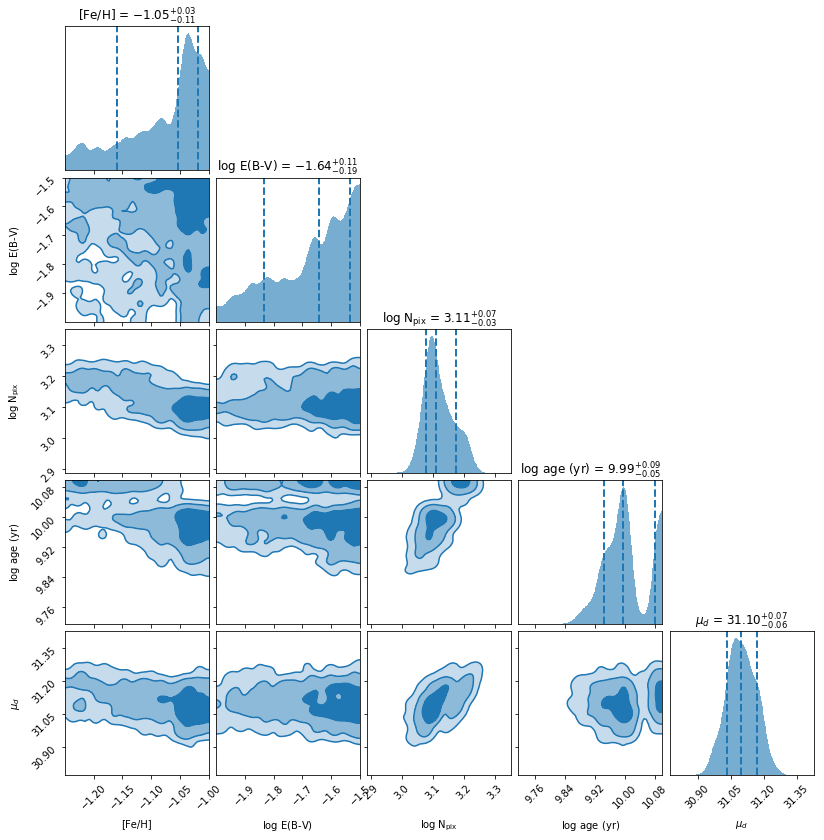

In [48]:
results['DF2_m1'].plot_corner();

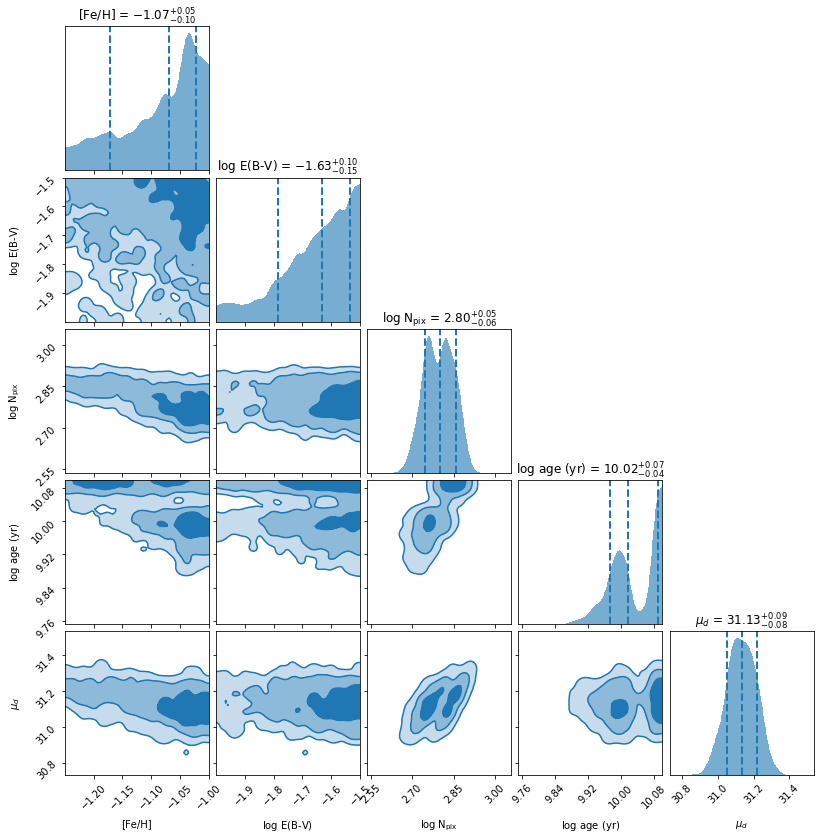

In [49]:
results['DF2_m3'].plot_corner();

KeyError: 'DF2'

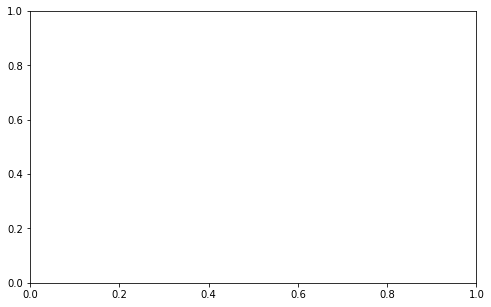

In [47]:
gal = 'DF2'
fig, ax = plt.subplots(figsize=(8, 5))
ppy.plotting.plot_pcmd_contours(pcmds[gal], ax=ax, label='Model')
ppy.plotting.plot_pcmd_contours(data[gal], ax=ax, keep_limits=True, color='k', label='Data', alpha=0.7)
ppy.plotting.plot_isochrone(iso_models[gal], dmod=dmods[gal], axes=ax)
ax.set_title('DF2')
ax.set_ylim([29.0, 27.5])
ax.set_xlim([-0.2, 1.5])
plt.tight_layout()
plt.savefig('figures/DF2_SSP_pcmd.pdf')

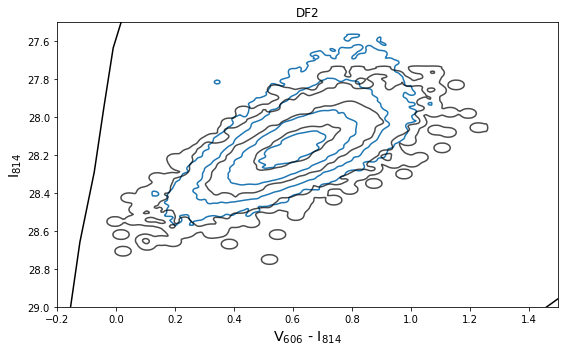

In [113]:
gal = 'DF2'
fig, ax = plt.subplots(figsize=(8, 5))
ppy.plotting.plot_pcmd_contours(pcmds[gal], ax=ax, label='Model')
ppy.plotting.plot_pcmd_contours(data[gal], ax=ax, keep_limits=True, color='k', label='Data', alpha=0.7)
ppy.plotting.plot_isochrone(iso_models[gal], dmod=dmods[gal], axes=ax)
ax.set_title('DF2')
ax.set_ylim([29.0, 27.5])
ax.set_xlim([-0.2, 1.5])
plt.tight_layout()
plt.savefig('figures/DF2_SSP_pcmd.pdf')

In [14]:
d_mpc = ppy.distancemodels.dmod_to_mpc(results['DF2_m2'].equal_samples[:,-2])

In [15]:
np.mean(d_mpc)

16.721628654030205

In [16]:
np.std(d_mpc)

0.5304687188756662